<a href="https://colab.research.google.com/github/moreirarodrigo-eo/Discharge_Deforestation_Correlation/blob/main/Panel_Drainage_Area_Consistency_Check_OK_BACIAS_VAZAO_DEFORESTATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
os.chdir('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO')

In [ ]:
!pip install hydrobr -q
!pip install geopandas -q
import hydrobr
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from plotly.offline import plot
from IPython.display import HTML
import json
!pip install geemap -q
import geemap
!pip install hydroeval -q
from hydroeval import kge
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.3 MB/s eta 0:00:00


In [ ]:
geemap.ee_initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=WGV1gs93I8iRVuemc0cefXZVRj_qkcS8hHpmOPME7i0&tc=BCe4zPaKqUJByQj8lElJFLWmy36qaHtoYPyPQiapju0&cc=pJkW3K3duXETm30y9tmbtJSmqSWzQaaXyibj-88hJcY

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AfJohXkcBD2x5hgnCRaTm1gi9iO6kCdKhhcS5J_GFHhCgtnFHSnRxrac22A

Successfully saved authorization token.


##**Extract ANA data**

In [ ]:
area_name = '_AMAZON_BIOME'

In [ ]:
flow_list = hydrobr.get_data.ANA.list_flow_stations()
flow_list.head()
stations_code = flow_list.Code.to_list()

In [ ]:
area_of_interest = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')

flow_stations = hydrobr.get_data.ANA.list_flow_stations()

flow_stations_gdf = gpd.GeoDataFrame(flow_stations, geometry=gpd.points_from_xy(flow_stations.Longitude, flow_stations.Latitude), crs=area_of_interest.crs)

stations_within_area_of_interest = flow_stations_gdf[flow_stations_gdf.within(area_of_interest.unary_union)]

map_box_access_token = 'pk.eyJ1IjoibW9yZWlyYXJtdCIsImEiOiJjbGZtbnRhdzUwM3RnNDRwYzdwbWl3ZzJtIn0.tAtQDrQM2NHh5-ZUFBGapA'

spatial_fig = hydrobr.Plot.spatial_stations(stations_within_area_of_interest, map_box_access_token)
spatial_fig.update_layout(
    mapbox=dict(zoom=7),
    height=1000,
    width=1200,)
plot(spatial_fig,filename='spatial_within_shapefile' + '.html')
HTML(filename='spatial_within_shapefile.html')

In [ ]:
station_codes = pd.DataFrame(stations_within_area_of_interest.Code)
station_lat = pd.DataFrame(stations_within_area_of_interest.Latitude)
station_long = pd.DataFrame(stations_within_area_of_interest.Longitude)
stations_codes_lat = station_codes.merge(station_lat, left_index=True, right_index=True)

stations_codes_lat_long = stations_codes_lat.merge(station_long, left_index=True, right_index=True)
stations_codes_lat_long.to_csv('stations_codes_lat_long.csv')

In [ ]:
station_codes = stations_within_area_of_interest.Code.to_list()
# Baixando as estações
flow_data = hydrobr.get_data.ANA.flow_data(station_codes)

In [ ]:
flow_data.describe()

,10100000,10200000,10300000,10500000,10800000,10900000,10910000,11400000,11444900,11450000,...,66055000,66065000,66071300,66071382,66071385,66071400,66072000,66072001,66074000,66076000
count,10052.000000,14393.000000,9924.000000,15271.000000,4022.000000,5484.000000,5245.000000,18215.000000,7512.000000,10378.000000,...,17271.000000,16468.000000,2216.000000,1586.000000,4668.000000,10534.000000,13511.000000,365.000000,592.000000,8294.000000
mean,39687.808813,647.930202,1001.633316,2625.896870,786.489184,731.483242,1586.263158,46255.699802,6294.414826,7613.866130,...,223.167544,75.014231,65.704332,78.896413,71.380296,88.775486,117.847864,99.080822,163.752111,97.039556
std,13520.321455,400.302709,626.574805,1405.990564,472.509277,415.191796,1010.737617,15435.101230,2287.220095,2467.020583,...,101.181892,57.727018,10.069623,38.859724,20.613168,22.912316,52.476479,25.097032,261.344786,31.774277
min,9504.320000,6.840000,41.560000,190.010000,71.000000,84.000000,141.810000,13087.100000,498.370000,1379.160000,...,85.565100,12.469900,31.000000,19.251100,0.000000,0.000000,46.144700,69.700000,1.000000,51.520000
25%,28060.500000,270.800000,409.002500,1317.270000,352.000000,335.750000,686.542000,32920.550000,4527.960000,5712.600000,...,152.053000,34.673400,58.900000,68.226200,63.000000,75.338200,83.600000,76.500000,2.930000,71.680000
50%,40865.900000,616.020000,956.270000,2726.210000,753.000000,752.000000,1353.380000,46336.100000,6417.410000,7674.790000,...,189.432000,52.025200,66.800000,74.240200,69.000000,83.788400,98.846300,91.900000,6.645000,88.000000
75%,51255.975000,1006.060000,1573.250000,3874.740000,1231.000000,1122.000000,2458.130000,59701.300000,8272.330000,9576.970000,...,272.091000,100.670750,74.600000,81.506700,79.000000,97.900100,135.606000,117.000000,249.000000,120.640000
max,66020.600000,1707.420000,2292.390000,5322.910000,1724.000000,1481.000000,4912.500000,80954.900000,12485.700000,13872.100000,...,1224.160000,496.170000,87.300000,547.793000,740.000000,342.478000,659.578000,164.000000,945.000000,220.000000


In [ ]:
flow_data.to_csv('results/flow_data_stations'+area_name+'.csv')

In [ ]:
df_flow_data = pd.read_csv('results/flow_data_stations'+area_name+'.csv')
df_flow_data = df_flow_data.rename(columns = {'Unnamed: 0': 'date'})
df_flow_data['date'] = pd.to_datetime(df_flow_data['date'])
df_flow_data

,date,10100000,10200000,10300000,10500000,10800000,10900000,10910000,11400000,11444900,...,66055000,66065000,66071300,66071382,66071385,66071400,66072000,66072001,66074000,66076000
0,1927-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1927-12-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1927-12-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1927-12-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1927-12-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34937,2023-07-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34938,2023-07-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34939,2023-07-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34940,2023-07-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_flow_data = df_flow_data.set_index('date')
df_flow_data = df_flow_data.loc['1981-01-01':'2020-12-31']
df_flow_data

,10100000,10200000,10300000,10500000,10800000,10900000,10910000,11400000,11444900,11450000,...,66055000,66065000,66071300,66071382,66071385,66071400,66072000,66072001,66074000,66076000
date,,,,,,,,,,,,,,,,,,,,,
1981-01-01,NaN,NaN,941.06,2741.27,400.0,426.0,NaN,42229.9,NaN,5219.71,...,329.341,62.3663,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.12
1981-01-02,NaN,NaN,855.60,2677.50,389.0,375.0,NaN,41454.6,NaN,5185.92,...,331.115,53.2199,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.16
1981-01-03,NaN,NaN,691.58,2610.60,373.0,336.0,NaN,41262.4,NaN,5140.97,...,313.456,53.9992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.00
1981-01-04,NaN,NaN,563.47,2406.56,352.0,304.0,NaN,41022.9,NaN,5084.94,...,306.439,61.9604,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.28
1981-01-05,NaN,NaN,507.84,2191.50,330.0,288.0,NaN,40499.6,NaN,5107.33,...,429.076,123.6520,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,45601.3,868.83,NaN,3802.04,NaN,NaN,NaN,49874.9,NaN,NaN,...,144.537,31.3609,NaN,NaN,NaN,64.4258,77.7276,NaN,NaN,NaN
2020-12-28,45434.8,813.70,NaN,3814.83,NaN,NaN,NaN,50185.6,NaN,NaN,...,157.719,29.7624,NaN,NaN,NaN,72.8411,73.7915,NaN,NaN,NaN
2020-12-29,45310.1,771.87,NaN,3844.74,NaN,NaN,NaN,50133.7,NaN,NaN,...,152.747,29.5871,NaN,NaN,NaN,76.1788,71.5167,NaN,NaN,NaN


In [ ]:
null_percentage = df_flow_data.isnull().sum()/df_flow_data.shape[0]*100

col_to_drop = null_percentage[null_percentage > 10].keys()

df_flow_data_less_10_nan = df_flow_data.drop(col_to_drop, axis=1)
df_flow_data_less_10_nan.describe()

,10200000,10500000,11400000,11500000,12100000,12360000,12370000,12400000,12500000,12520000,...,32830000,32850000,33075000,33170000,33190000,33290000,33380000,66006000,66010000,66050000
count,13579.000000,14367.000000,14610.000000,14610.000000,13545.000000,13681.00000,13505.000000,14527.000000,13617.000000,13810.000000,...,14556.000000,13576.000000,14493.000000,14378.000000,14610.000000,14610.000000,14193.000000,14237.000000,14021.000000,13759.000000
mean,645.989400,2621.346738,46256.050089,56957.503819,515.387712,181.89664,403.041322,32.175811,918.815332,1387.627950,...,82.006340,18.917627,4.776253,20.466119,206.796255,102.618736,96.766597,36.155628,170.084599,163.342597
std,400.214535,1402.657673,15730.760659,18510.751203,389.762089,252.61121,476.419477,34.327216,810.644060,1069.615705,...,104.042201,27.765084,5.303115,33.268329,239.959974,104.611525,154.811282,27.886174,154.015133,75.184682
min,6.840000,190.010000,13087.100000,15039.700000,17.080000,0.00000,2.500000,4.784500,31.540000,85.780000,...,0.051400,0.000000,0.056000,0.515400,3.152300,24.070000,0.710000,1.962100,1.287200,57.739400
25%,270.480000,1323.000000,32583.700000,41067.100000,158.560000,22.05000,62.450000,11.738200,221.800000,369.450000,...,6.825700,1.480000,1.468600,3.668000,43.411275,47.450000,9.411900,17.521800,61.356000,109.833000
50%,611.020000,2718.700000,46938.000000,58205.600000,435.740000,83.53000,212.380000,19.926600,670.730000,1116.580000,...,33.442000,6.790000,2.780000,7.343600,89.531150,62.140000,25.194300,27.239700,109.211000,138.007000
75%,1002.000000,3870.450000,59873.500000,71971.900000,841.280000,240.73000,582.290000,38.973200,1404.260000,2289.050000,...,123.394000,26.330000,5.927800,21.662875,282.056750,104.400000,111.567000,47.147200,232.380000,200.897000
max,1707.420000,5322.910000,80954.900000,100074.000000,1748.760000,3012.55000,3307.150000,466.744000,3997.240000,3878.010000,...,570.060000,281.240000,55.640200,409.390000,1215.600000,1101.410000,1027.650000,355.190000,1164.020000,713.972000


In [ ]:
df_flow_data_stations = df_flow_data_less_10_nan.columns.to_list()
df_flow_data_stations

In [ ]:
stations_codes_lat_long = stations_codes_lat_long[stations_codes_lat_long['Code'].isin(df_flow_data_stations)]
stations_codes_lat_long

,Code,Latitude,Longitude
8,10200000,-5.1389,-72.8136
10,10500000,-4.3408,-70.9056
14,11400000,-3.4569,-68.9119
17,11500000,-3.1017,-67.9356
18,12100000,-4.6514,-68.3244
...,...,...,...
589,33290000,-4.2194,-44.7653
597,33380000,-3.7722,-45.2181
3140,66006000,-14.4517,-56.8142
3142,66010000,-15.0761,-57.1819


<ipython-input-17-328f643ab11e>:8: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



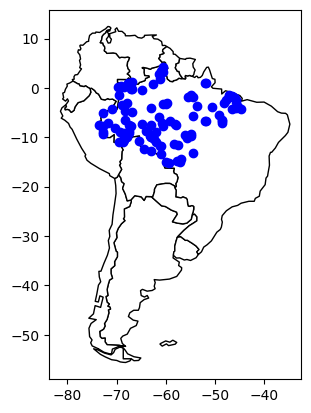

In [ ]:
import matplotlib.pyplot as plt

pontos = [Point(x) for x in zip(stations_codes_lat_long.Longitude,
                                stations_codes_lat_long.Latitude)]
crs={'proj':'latlong','ellps':'WGS84','datum':'WGS84','no_def':True}
stations_codes_lat_long_gdf = gpd.GeoDataFrame(stations_codes_lat_long, geometry=pontos,crs=crs)

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world[world.continent == 'South America'].plot(
    color='white', edgecolor='black')

stations_codes_lat_long_gdf.plot(ax=ax, color='blue')
plt.show()

In [ ]:
# gantt_fig_1981_2020 = hydrobr.Plot.gantt(df_flow_data)
# #Atualizando o layout da figura
# gantt_fig_1981_2020.update_layout(
#     autosize=False,
#     width=1200, #Determina a largura da figura em pixels
#     height=800, #Determina a altura da figura em pixels
#     xaxis_title = 'Ano', #Título do eixo
#     yaxis_title = 'Código da Estação', #Título do eixo y.
#     font=dict(family="Courier New, monospace", size=12))
# gantt_fig_1981_2020

In [ ]:
import ee
roi = stations_codes_lat_long_gdf
roi = roi.to_json()
roi = json.loads(roi)
roi = roi["features"]
ee_roi = ee.FeatureCollection(roi)

task = ee.batch.Export.table.toAsset(**{
    'collection': ee_roi,
    'description': 'myExportTableTask',
    'assetId': 'projects/ee-moreirarmt/assets/VAZAO_TO_BUFFER_PAPER_stations_'+area_name
})
task.start()

In [ ]:
stations_codes_lat_long_gdf.to_file('results/stations_within_area_of_interest'+area_name+'.geojson', driver='GeoJSON')
stations_codes_lat_long_gdf.to_file('results/stations_within_area_of_interest'+area_name+'.gpkg', driver='GPKG')

##**Extract DEFORESTATION data**

In [ ]:
import ee

flow_stations = ee.FeatureCollection('projects/ee-moreirarmt/assets/VAZAO_TO_BUFFER_PAPER_stations_'+area_name)
flow_stations_df = geemap.ee_to_pandas(flow_stations)
flow_stations_df_lat = flow_stations_df['Latitude'].get(1)
flow_stations_df_long = flow_stations_df['Longitude'].get(1)
asset = ee.Image("projects/mapbiomas-workspace/public/collection7/mapbiomas_collection70_integration_v2");
Map = geemap.Map(center=(flow_stations_df_lat, flow_stations_df_long), zoom=5)
Map.add_basemap('HYBRID')
Map.addLayer(flow_stations, {'color': 'black'}, 'flow_stations')
Map.addLayerControl()
Map

Map(center=[-4.3408, -70.9056], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(ch…

In [ ]:
asset = ee.Image("projects/mapbiomas-workspace/public/collection7/mapbiomas_collection70_integration_v2");

https://rmets.onlinelibrary.wiley.com/doi/abs/10.1002/joc.4886?casa_token=XrHwqfpRPoUAAAAA:9_Fxg08DsyP2gXO5BXnIDgnNjXCL-8ty7q220abLQkYJfNkxeaFrglW7sjrMxUpE9mI-e8hSln-vJwRH1w

In [ ]:
import ee
def buff(feat):
  return feat.buffer(buffer)
points = ee.FeatureCollection('projects/ee-moreirarmt/assets/VAZAO_TO_BUFFER_PAPER_stations_'+area_name)
buffer = 10000
points = points.map(buff)
Map.add_basemap('HYBRID')
Map.addLayer(points, {'color': 'black'}, 'Points_buffer')
Map.addLayerControl()
Map

Google Hybrid has been already added before.


Map(bottom=17547.0, center=[-9.438224391343335, -67.84057617187501], controls=(WidgetControl(options=['positio…

##**DADOS**

In [ ]:
df_defor = pd.read_excel('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/results/PERCENT_FOREST.xlsx').set_index('year')
df_defor
# df_defor = df_defor[['area',	'class',	'year']]
# df_defor=df_defor[df_defor['class'] == 3]
# df_defor = df_defor.drop(columns = 'class')
# df_defor['Code'] = 'station_' + df_defor['Code'].astype(str)
# df_defor
# df_defor.pivot(columns='year')

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
year,,,,,,,,,,,,,,,,,,,,,
1985,99.290948,99.329704,86.367754,74.632031,96.584216,98.916765,99.290724,100.000000,80.437730,95.614460,...,55.147678,44.291285,84.352578,89.363470,48.441886,25.932508,59.261349,39.844854,39.862008,77.624901
1986,99.341350,99.348951,86.360385,74.637747,96.598887,98.991434,99.306874,100.000000,78.745747,95.373631,...,58.414867,42.913908,85.353232,89.012137,51.783152,25.097885,59.785661,43.913438,41.129947,76.676639
1987,99.356859,99.356813,86.370178,74.723701,96.580807,98.979425,99.292759,100.000000,77.327478,94.825052,...,57.359535,41.637031,83.270474,88.117777,51.214945,24.154411,57.250308,44.322477,40.884327,76.209320
1988,99.288283,99.372158,86.356986,74.726339,96.599715,98.951126,99.286338,100.000000,76.887270,94.240090,...,52.843153,39.008668,80.023699,84.826600,45.939865,23.092901,51.988748,43.461925,39.982215,76.244369
1989,99.285186,99.372955,86.395154,74.729080,96.599715,99.002215,99.262243,99.921285,76.077948,94.057556,...,51.473893,36.696789,80.352212,78.308161,34.797249,21.455958,39.875386,42.337127,39.685518,77.172788
1990,99.252944,99.375557,86.377499,74.735066,96.575745,99.022959,99.239658,99.839341,75.310603,93.978490,...,50.526876,35.990745,79.689485,77.965543,33.631223,20.797596,38.918012,42.856204,39.781416,77.858815
1991,99.241049,99.361138,86.346586,74.751641,96.576883,99.065030,99.222449,99.343488,74.275822,93.847411,...,48.917955,35.005906,79.177839,80.118486,34.395370,21.313813,39.994660,41.757122,39.462515,77.783350
1992,99.273022,99.353937,86.314658,74.546188,96.554360,99.087217,99.181961,98.751553,74.350789,93.602828,...,45.087212,32.398837,73.810040,74.303004,36.991768,20.069426,40.615293,42.235628,38.975316,77.708269
1993,99.267482,99.338494,86.250503,74.519731,96.598477,99.086310,99.130435,98.161537,73.331767,92.690304,...,42.264396,31.266855,72.978841,71.101192,34.497469,16.249451,37.622897,41.408331,38.296835,76.633335


In [ ]:
df_perc_defor = pd.DataFrame(df_defor.iloc[0]-df_defor.iloc[-1])
df_perc_defor = df_perc_defor.rename(columns = {0:'perc_deforestation'})
df_perc_defor_cols = df_perc_defor.index.tolist()
df_perc_defor_cols

['station_10200000',
 'station_10500000',
 'station_11400000',
 'station_11500000',
 'station_12100000',
 'station_12360000',
 'station_12370000',
 'station_12400000',
 'station_12500000',
 'station_12520000',
 'station_12650000',
 'station_12700000',
 'station_12840000',
 'station_12845000',
 'station_13150000',
 'station_13180000',
 'station_13300000',
 'station_13410000',
 'station_13450000',
 'station_13470000',
 'station_13550000',
 'station_13600002',
 'station_13650000',
 'station_13710001',
 'station_13740000',
 'station_13750000',
 'station_13870000',
 'station_14100000',
 'station_14110000',
 'station_14230000',
 'station_14250000',
 'station_14260000',
 'station_14280001',
 'station_14300000',
 'station_14310000',
 'station_14330000',
 'station_14350000',
 'station_14420000',
 'station_14440000',
 'station_14495000',
 'station_14515000',
 'station_14680001',
 'station_14710000',
 'station_15030000',
 'station_15040000',
 'station_15050000',
 'station_15120001',
 'station_151

In [ ]:
df_flow_data = pd.read_csv('results/flow_data_stations_AMAZON_BIOME.csv')
df_flow_data = df_flow_data.rename(columns = {'Unnamed: 0':'date'})
df_flow_data = df_flow_data.set_index('date')

FileNotFoundError: ignored

In [ ]:
df_flow_data = df_flow_data.loc['1981-01-01':'2022-12-31']
df_flow_data

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
date,,,,,,,,,,,,,,,,,,,,,
1981-01-01,NaN,2741.27,42229.9,50721.9,NaN,NaN,NaN,11.0212,406.91,NaN,...,5.8275,NaN,1.1637,2.5899,20.6932,63.62,13.2638,80.5175,338.392,193.1380
1981-01-02,NaN,2677.50,41454.6,50130.9,NaN,NaN,NaN,10.2300,371.88,NaN,...,6.4571,NaN,1.2110,3.1826,21.3577,65.08,13.5556,118.1910,327.558,207.3310
1981-01-03,NaN,2610.60,41262.4,49649.4,NaN,NaN,NaN,10.2300,339.80,NaN,...,7.2400,NaN,1.3600,2.9462,21.3577,64.49,14.7453,119.4200,315.876,209.3830
1981-01-04,NaN,2406.56,41022.9,49169.9,NaN,NaN,NaN,12.4710,316.58,NaN,...,7.9145,NaN,1.5200,3.2311,24.3973,63.91,18.1970,114.5340,316.844,213.5050
1981-01-05,NaN,2191.50,40499.6,48692.3,NaN,NaN,NaN,18.3182,425.81,NaN,...,8.7494,NaN,1.5200,2.9926,25.8898,63.62,19.8501,110.9230,354.360,258.6010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,868.83,3802.04,49874.9,61666.7,1385.10,310.52,745.72,57.9493,1150.76,1768.64,...,45.5400,0.94,5.7500,13.7200,144.8200,63.56,44.6800,20.1425,NaN,71.4187
2020-12-28,813.70,3814.83,50185.6,62134.4,1426.80,281.28,1117.92,70.4513,1668.05,1903.89,...,44.4000,0.85,5.7500,12.6200,144.2400,63.92,54.7200,31.6901,NaN,67.7295
2020-12-29,771.87,3844.74,50133.7,62368.8,1469.01,255.63,975.40,61.8378,2121.40,2043.47,...,39.2200,0.85,5.7500,10.9200,140.8300,64.27,57.3400,24.8203,NaN,64.8235


In [ ]:
null_percentage = df_flow_data.isnull().sum()/df_flow_data.shape[0]*100

col_to_drop = null_percentage[null_percentage > 10].keys()

df_flow_data = df_flow_data.drop(col_to_drop, axis=1)
df_flow_data = df_flow_data.drop('14550000', axis = 1)
df_flow_data_cols = df_flow_data.columns.to_list()

df_flow_data

,10200000,10500000,11400000,11500000,12100000,12360000,12370000,12400000,12500000,12520000,...,32830000,32850000,33075000,33170000,33190000,33290000,33380000,66006000,66010000,66050000
date,,,,,,,,,,,,,,,,,,,,,
1981-01-01,NaN,2741.27,42229.9,50721.9,NaN,NaN,NaN,11.0212,406.91,NaN,...,5.8275,NaN,1.1637,2.5899,20.6932,63.62,13.2638,80.5175,338.392,193.1380
1981-01-02,NaN,2677.50,41454.6,50130.9,NaN,NaN,NaN,10.2300,371.88,NaN,...,6.4571,NaN,1.2110,3.1826,21.3577,65.08,13.5556,118.1910,327.558,207.3310
1981-01-03,NaN,2610.60,41262.4,49649.4,NaN,NaN,NaN,10.2300,339.80,NaN,...,7.2400,NaN,1.3600,2.9462,21.3577,64.49,14.7453,119.4200,315.876,209.3830
1981-01-04,NaN,2406.56,41022.9,49169.9,NaN,NaN,NaN,12.4710,316.58,NaN,...,7.9145,NaN,1.5200,3.2311,24.3973,63.91,18.1970,114.5340,316.844,213.5050
1981-01-05,NaN,2191.50,40499.6,48692.3,NaN,NaN,NaN,18.3182,425.81,NaN,...,8.7494,NaN,1.5200,2.9926,25.8898,63.62,19.8501,110.9230,354.360,258.6010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,868.83,3802.04,49874.9,61666.7,1385.10,310.52,745.72,57.9493,1150.76,1768.64,...,45.5400,0.94,5.7500,13.7200,144.8200,63.56,44.6800,20.1425,NaN,71.4187
2020-12-28,813.70,3814.83,50185.6,62134.4,1426.80,281.28,1117.92,70.4513,1668.05,1903.89,...,44.4000,0.85,5.7500,12.6200,144.2400,63.92,54.7200,31.6901,NaN,67.7295
2020-12-29,771.87,3844.74,50133.7,62368.8,1469.01,255.63,975.40,61.8378,2121.40,2043.47,...,39.2200,0.85,5.7500,10.9200,140.8300,64.27,57.3400,24.8203,NaN,64.8235


In [ ]:
df_flow_data_cols

['10200000',
 '10500000',
 '11400000',
 '11500000',
 '12100000',
 '12360000',
 '12370000',
 '12400000',
 '12500000',
 '12520000',
 '12650000',
 '12700000',
 '12840000',
 '12845000',
 '13150000',
 '13180000',
 '13300000',
 '13410000',
 '13450000',
 '13470000',
 '13550000',
 '13600002',
 '13650000',
 '13710001',
 '13740000',
 '13750000',
 '13870000',
 '14100000',
 '14110000',
 '14230000',
 '14250000',
 '14260000',
 '14280001',
 '14300000',
 '14310000',
 '14330000',
 '14350000',
 '14420000',
 '14440000',
 '14495000',
 '14515000',
 '14680001',
 '14710000',
 '15030000',
 '15040000',
 '15050000',
 '15120001',
 '15130000',
 '15150000',
 '15200000',
 '15250000',
 '15400000',
 '15430000',
 '15431000',
 '15432000',
 '15550000',
 '15552600',
 '15558000',
 '15560000',
 '15565000',
 '15580000',
 '15630000',
 '15700000',
 '15800000',
 '15830000',
 '15910000',
 '17050001',
 '17090000',
 '17093000',
 '17120000',
 '17340000',
 '17345000',
 '17350000',
 '17380000',
 '17420000',
 '17430000',
 '18200000',

In [ ]:
df_flow_data.columns = df_perc_defor_cols
df_flow_data
df_flow_data_columns_equal_df_defor = df_flow_data
df_flow_data_columns_equal_df_defor.to_csv('results/df_flow_data_columns_equal_df_defor.csv')

# **Flow data into mm.year**

In [ ]:
df_flow_data_columns_equal_df_defor = pd.read_csv('results/df_flow_data_columns_equal_df_defor.csv').set_index('date')
df_flow_data_columns_equal_df_defor#.iloc[:, [0,1,3]]

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
date,,,,,,,,,,,,,,,,,,,,,
1981-01-01,NaN,2741.27,42229.9,50721.9,NaN,NaN,NaN,11.0212,406.91,NaN,...,5.8275,NaN,1.1637,2.5899,20.6932,63.62,13.2638,80.5175,338.392,193.1380
1981-01-02,NaN,2677.50,41454.6,50130.9,NaN,NaN,NaN,10.2300,371.88,NaN,...,6.4571,NaN,1.2110,3.1826,21.3577,65.08,13.5556,118.1910,327.558,207.3310
1981-01-03,NaN,2610.60,41262.4,49649.4,NaN,NaN,NaN,10.2300,339.80,NaN,...,7.2400,NaN,1.3600,2.9462,21.3577,64.49,14.7453,119.4200,315.876,209.3830
1981-01-04,NaN,2406.56,41022.9,49169.9,NaN,NaN,NaN,12.4710,316.58,NaN,...,7.9145,NaN,1.5200,3.2311,24.3973,63.91,18.1970,114.5340,316.844,213.5050
1981-01-05,NaN,2191.50,40499.6,48692.3,NaN,NaN,NaN,18.3182,425.81,NaN,...,8.7494,NaN,1.5200,2.9926,25.8898,63.62,19.8501,110.9230,354.360,258.6010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,868.83,3802.04,49874.9,61666.7,1385.10,310.52,745.72,57.9493,1150.76,1768.64,...,45.5400,0.94,5.7500,13.7200,144.8200,63.56,44.6800,20.1425,NaN,71.4187
2020-12-28,813.70,3814.83,50185.6,62134.4,1426.80,281.28,1117.92,70.4513,1668.05,1903.89,...,44.4000,0.85,5.7500,12.6200,144.2400,63.92,54.7200,31.6901,NaN,67.7295
2020-12-29,771.87,3844.74,50133.7,62368.8,1469.01,255.63,975.40,61.8378,2121.40,2043.47,...,39.2200,0.85,5.7500,10.9200,140.8300,64.27,57.3400,24.8203,NaN,64.8235


In [ ]:
df_flow_data_columns_equal_df_defor_melt = df_flow_data_columns_equal_df_defor.melt(ignore_index = False)
df_flow_data_columns_equal_df_defor_melt.rename(columns = {'variable':'codigo', 'value' : 'flow'}, inplace = True)
df_flow_data_columns_equal_df_defor_melt_list = df_flow_data_columns_equal_df_defor_melt.codigo.tolist()
df_flow_data_columns_equal_df_defor_melt.codigo.value_counts()

station_10200000    14610
station_18500000    14610
station_18420000    14610
station_18250000    14610
station_18200000    14610
                    ...  
station_14280001    14610
station_14260000    14610
station_14250000    14610
station_14230000    14610
station_66050000    14610
Name: codigo, Length: 107, dtype: int64

In [ ]:
stations_stats = gpd.read_file('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/watersheds_with_code_areakm2/watershed_vector_station_codes.shp')
# stations_stats = pd.read_excel('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/stations_statistics.xlsx')

stations_drainage_area = pd.DataFrame(stations_stats[['codigo', 'adkm2']])

stations_drainage_area = stations_drainage_area[stations_drainage_area['codigo'].isin(df_flow_data_columns_equal_df_defor_melt_list)]
stations_drainage_area = stations_drainage_area.groupby('codigo').mean().reset_index()
# stations_drainage_area['codigo'] = 'station_' + stations_drainage_area['codigo'].astype(str)
stations_drainage_area.value_counts()

codigo            adkm2     
station_10200000  2745.0130     1
station_18500000  14464.1380    1
station_18420000  103.3635      1
station_18250000  991.5615      1
station_18200000  11755.2620    1
                               ..
station_14280001  10235.6220    1
station_14260000  9464.3290     1
station_14250000  10788.1285    1
station_14230000  10763.6960    1
station_66050000  71.9420       1
Length: 107, dtype: int64

In [ ]:
# Create dataframes
df1 = pd.DataFrame(df_flow_data_columns_equal_df_defor_melt)
df2 = pd.DataFrame(stations_drainage_area)
# Merge the two DataFrames
df = df1.merge(df2, on= 'codigo')
df
# # Divide the values of the specified columns by adkm2
df['flow_divided'] = df['flow'].div(df['adkm2'])
df
df_index = pd.DataFrame(df1.index)
df_index
df_index = df_index.rename(columns = {'date':''}).set_index("")
df_index
df = df.drop(['flow', 'adkm2'], axis=1).set_index(df_index.index)
df_pivot = df.pivot(columns= 'codigo', values = 'flow_divided')
df_pivot.describe()
df_pivot = df_pivot.rename_axis('date')
df_pivot
df_pivot.to_csv('results/df_flow_data_columns_equal_df_defor_divided.csv')

In [ ]:
df_flow_data_columns_equal_df_defor = pd.read_csv('results/df_flow_data_columns_equal_df_defor_divided.csv')
df_flow_data_columns_equal_df_defor

,date,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
0,1981-01-01,NaN,2.049030,6.190559,16.621741,NaN,NaN,NaN,2.744323,0.621451,...,0.002475,NaN,0.000438,0.000325,0.006094,0.491544,0.010483,2.173916,0.198697,2.684635
1,1981-01-02,NaN,2.001363,6.076906,16.428069,NaN,NaN,NaN,2.547311,0.567951,...,0.002742,NaN,0.000456,0.000400,0.006290,0.502824,0.010713,3.191074,0.192335,2.881919
2,1981-01-03,NaN,1.951357,6.048731,16.270279,NaN,NaN,NaN,2.547311,0.518957,...,0.003074,NaN,0.000512,0.000370,0.006290,0.498265,0.011653,3.224256,0.185476,2.910442
3,1981-01-04,NaN,1.798843,6.013622,16.113146,NaN,NaN,NaN,3.105329,0.483495,...,0.003361,NaN,0.000573,0.000406,0.007185,0.493784,0.014381,3.092338,0.186044,2.967738
4,1981-01-05,NaN,1.638091,5.936911,15.956634,NaN,NaN,NaN,4.561305,0.650315,...,0.003715,NaN,0.000573,0.000376,0.007625,0.491544,0.015688,2.994843,0.208073,3.594576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,2020-12-27,0.316512,2.841929,7.311253,20.208390,1.605096,0.201175,0.159264,14.429607,1.757491,...,0.019338,0.000999,0.002166,0.001724,0.042651,0.491080,0.035311,0.543833,NaN,0.992726
14606,2020-12-28,0.296428,2.851489,7.356800,20.361657,1.653419,0.182231,0.238755,17.542654,2.547518,...,0.018853,0.000903,0.002166,0.001586,0.042480,0.493861,0.043246,0.855610,NaN,0.941446
14607,2020-12-29,0.281190,2.873846,7.349191,20.438470,1.702334,0.165614,0.208317,15.397859,3.239894,...,0.016654,0.000903,0.002166,0.001372,0.041475,0.496566,0.045317,0.670131,NaN,0.901052
14608,2020-12-30,0.271030,2.873846,7.334005,20.476910,1.754759,0.164843,0.185616,6.864517,3.915043,...,0.014858,0.000903,0.002166,0.001189,0.039170,0.499347,0.038544,0.528592,NaN,0.901052


# **Impute values**

In [ ]:
!pip install fancyimpute
from fancyimpute import IterativeImputer
import pandas as pd

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 4.9 MB/s eta 0:00:00
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29879 sha256=4a013449ada64d84d0afb4b5d4a3d2db06f50d951ffefa3ca6fa9aabcfbc8acc
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11329 sha256=e3713d3a577800fd57e2878a42a30c69809367bf755032e699936bdceaa52657
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute


In [ ]:
mice_imputer = IterativeImputer()
df_flow_data_columns_equal_df_defor = pd.read_csv('results/df_flow_data_columns_equal_df_defor_divided.csv')
df_flow_data_columns_equal_df_defor['date'] = pd.to_datetime(df_flow_data_columns_equal_df_defor['date'], format = '%Y-%m-%d')
df_flow_data_columns_equal_df_defor = df_flow_data_columns_equal_df_defor.set_index(['date'])
df_mice_imputed = pd.DataFrame(mice_imputer.fit_transform(df_flow_data_columns_equal_df_defor), columns=df_flow_data_columns_equal_df_defor.columns)
df_mice_imputed

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
0,0.206749,2.049030,6.190559,16.621741,0.714784,0.117237,0.061843,2.744323,0.621451,2.562750,...,0.002475,0.001201,0.000438,0.000325,0.006094,0.491544,0.010483,2.173916,0.198697,2.684635
1,0.203386,2.001363,6.076906,16.428069,0.694244,0.096180,0.059313,2.547311,0.567951,2.381591,...,0.002742,-0.001487,0.000456,0.000400,0.006290,0.502824,0.010713,3.191074,0.192335,2.881919
2,0.202295,1.951357,6.048731,16.270279,0.681615,0.123093,0.078335,2.547311,0.518957,2.258137,...,0.003074,-0.002927,0.000512,0.000370,0.006290,0.498265,0.011653,3.224256,0.185476,2.910442
3,0.186988,1.798843,6.013622,16.113146,0.695221,0.149251,0.090643,3.105329,0.483495,2.159969,...,0.003361,-0.002868,0.000573,0.000406,0.007185,0.493784,0.014381,3.092338,0.186044,2.967738
4,0.178687,1.638091,5.936911,15.956634,0.666349,0.192804,0.120545,4.561305,0.650315,2.349092,...,0.003715,-0.003632,0.000573,0.000376,0.007625,0.491544,0.015688,2.994843,0.208073,3.594576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,0.316512,2.841929,7.311253,20.208390,1.605096,0.201175,0.159264,14.429607,1.757491,4.512942,...,0.019338,0.000999,0.002166,0.001724,0.042651,0.491080,0.035311,0.543833,-0.002274,0.992726
14606,0.296428,2.851489,7.356800,20.361657,1.653419,0.182231,0.238755,17.542654,2.547518,4.858052,...,0.018853,0.000903,0.002166,0.001586,0.042480,0.493861,0.043246,0.855610,-0.002367,0.941446
14607,0.281190,2.873846,7.349191,20.438470,1.702334,0.165614,0.208317,15.397859,3.239894,5.214211,...,0.016654,0.000903,0.002166,0.001372,0.041475,0.496566,0.045317,0.670131,0.010067,0.901052
14608,0.271030,2.873846,7.334005,20.476910,1.754759,0.164843,0.185616,6.864517,3.915043,5.515254,...,0.014858,0.000903,0.002166,0.001189,0.039170,0.499347,0.038544,0.528592,0.018219,0.901052


In [ ]:
df_mice_imputed.to_csv('results/df_flow_data_divided_mice_imputed.csv')

In [ ]:
print(df_mice_imputed.isnull().sum())
df_mice_imputed

station_10200000    0
station_10500000    0
station_11400000    0
station_11500000    0
station_12100000    0
                   ..
station_33290000    0
station_33380000    0
station_66006000    0
station_66010000    0
station_66050000    0
Length: 107, dtype: int64


,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
0,0.206749,2.049030,6.190559,16.621741,0.714784,0.117237,0.061843,2.744323,0.621451,2.562750,...,0.002475,0.001201,0.000438,0.000325,0.006094,0.491544,0.010483,2.173916,0.198697,2.684635
1,0.203386,2.001363,6.076906,16.428069,0.694244,0.096180,0.059313,2.547311,0.567951,2.381591,...,0.002742,-0.001487,0.000456,0.000400,0.006290,0.502824,0.010713,3.191074,0.192335,2.881919
2,0.202295,1.951357,6.048731,16.270279,0.681615,0.123093,0.078335,2.547311,0.518957,2.258137,...,0.003074,-0.002927,0.000512,0.000370,0.006290,0.498265,0.011653,3.224256,0.185476,2.910442
3,0.186988,1.798843,6.013622,16.113146,0.695221,0.149251,0.090643,3.105329,0.483495,2.159969,...,0.003361,-0.002868,0.000573,0.000406,0.007185,0.493784,0.014381,3.092338,0.186044,2.967738
4,0.178687,1.638091,5.936911,15.956634,0.666349,0.192804,0.120545,4.561305,0.650315,2.349092,...,0.003715,-0.003632,0.000573,0.000376,0.007625,0.491544,0.015688,2.994843,0.208073,3.594576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,0.316512,2.841929,7.311253,20.208390,1.605096,0.201175,0.159264,14.429607,1.757491,4.512942,...,0.019338,0.000999,0.002166,0.001724,0.042651,0.491080,0.035311,0.543833,-0.002274,0.992726
14606,0.296428,2.851489,7.356800,20.361657,1.653419,0.182231,0.238755,17.542654,2.547518,4.858052,...,0.018853,0.000903,0.002166,0.001586,0.042480,0.493861,0.043246,0.855610,-0.002367,0.941446
14607,0.281190,2.873846,7.349191,20.438470,1.702334,0.165614,0.208317,15.397859,3.239894,5.214211,...,0.016654,0.000903,0.002166,0.001372,0.041475,0.496566,0.045317,0.670131,0.010067,0.901052
14608,0.271030,2.873846,7.334005,20.476910,1.754759,0.164843,0.185616,6.864517,3.915043,5.515254,...,0.014858,0.000903,0.002166,0.001189,0.039170,0.499347,0.038544,0.528592,0.018219,0.901052


In [ ]:
!pip install pymannkendall
import pandas as pd
import pymannkendall as mk
import scipy.stats.mstats as mstats

In [ ]:
df_mice_imputed = df_mice_imputed.set_index(df_flow_data_columns_equal_df_defor.index)
df_mice_imputed
df_mice_imputed.to_csv('results/df_mice_divided_imputed_date.csv')

In [ ]:
df_mice_imputed = pd.read_csv('results/df_mice_divided_imputed_date.csv').set_index('date')
df_mice_imputed

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
date,,,,,,,,,,,,,,,,,,,,,
1981-01-01,0.206749,2.049030,6.190559,16.621741,0.714784,0.117237,0.061843,2.744323,0.621451,2.562750,...,0.002475,0.001201,0.000438,0.000325,0.006094,0.491544,0.010483,2.173916,0.198697,2.684635
1981-01-02,0.203386,2.001363,6.076906,16.428069,0.694244,0.096180,0.059313,2.547311,0.567951,2.381591,...,0.002742,-0.001487,0.000456,0.000400,0.006290,0.502824,0.010713,3.191074,0.192335,2.881919
1981-01-03,0.202295,1.951357,6.048731,16.270279,0.681615,0.123093,0.078335,2.547311,0.518957,2.258137,...,0.003074,-0.002927,0.000512,0.000370,0.006290,0.498265,0.011653,3.224256,0.185476,2.910442
1981-01-04,0.186988,1.798843,6.013622,16.113146,0.695221,0.149251,0.090643,3.105329,0.483495,2.159969,...,0.003361,-0.002868,0.000573,0.000406,0.007185,0.493784,0.014381,3.092338,0.186044,2.967738
1981-01-05,0.178687,1.638091,5.936911,15.956634,0.666349,0.192804,0.120545,4.561305,0.650315,2.349092,...,0.003715,-0.003632,0.000573,0.000376,0.007625,0.491544,0.015688,2.994843,0.208073,3.594576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,0.316512,2.841929,7.311253,20.208390,1.605096,0.201175,0.159264,14.429607,1.757491,4.512942,...,0.019338,0.000999,0.002166,0.001724,0.042651,0.491080,0.035311,0.543833,-0.002274,0.992726
2020-12-28,0.296428,2.851489,7.356800,20.361657,1.653419,0.182231,0.238755,17.542654,2.547518,4.858052,...,0.018853,0.000903,0.002166,0.001586,0.042480,0.493861,0.043246,0.855610,-0.002367,0.941446
2020-12-29,0.281190,2.873846,7.349191,20.438470,1.702334,0.165614,0.208317,15.397859,3.239894,5.214211,...,0.016654,0.000903,0.002166,0.001372,0.041475,0.496566,0.045317,0.670131,0.010067,0.901052


In [ ]:
#Calculate by year
df_mice_imputed = pd.read_csv('results/df_mice_divided_imputed_date.csv')
df_mice_imputed['date'] = pd.to_datetime(df_mice_imputed['date'], format = '%Y-%m-%d')
df_mice_imputed=df_mice_imputed.set_index('date')
df_mice_imputed = df_mice_imputed.groupby(pd.Grouper(freq='Y')).sum()
mk_ss = {}
for col in df_mice_imputed.columns:
    # calculate Mann-Kendall trend test
    #df_precip_data_drop_na = df_precip_data[[col]].dropna()
    mk_result = mk.original_test(df_mice_imputed[col])

    # calculate Sen's slope
    #ss_result = mk.sens_slope(df_precip_data_test_no_na[col])

    # save results_50000m as a dictionary
    mk_ss[col] = {'MK_trend': mk_result.trend,
                  'MK_pvalue': mk_result.p,
                  'Zmk_value': mk_result.z,
                  'MK_slope': mk_result.slope,
                  ##Sens Slope
                 # 'SS_slope': ss_result.slope,
                  # 'SS_intercept': ss_result[1],
                  # 'SS_lower_bound': ss_result[2],
                  # 'SS_upper_bound': ss_result[3]
                  }

# convert dictionary to a pandas dataframe
df_mk_ss = pd.DataFrame.from_dict(mk_ss, orient='columns')

# print the dataframe
df_mk_ss.T

,MK_trend,MK_pvalue,Zmk_value,MK_slope
station_10200000,no trend,0.616375,0.500994,0.075815
station_10500000,no trend,0.239294,1.176754,1.476354
station_11400000,no trend,0.221194,1.223359,3.506577
station_11500000,increasing,0.027662,2.202046,19.724554
station_12100000,no trend,0.239294,1.176754,0.479495
...,...,...,...,...
station_33290000,no trend,0.172829,-1.363171,-2.02106
station_33380000,no trend,0.649548,-0.45439,-0.099687
station_66006000,decreasing,0.011462,-2.528274,-2.592119
station_66010000,decreasing,0.009372,-2.598181,-0.324948


In [ ]:
df_mk_ss.to_csv('results/mannKendall_SensSole_flow_divided_mice.csv')

In [ ]:
df_defor = pd.read_excel('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/results/PERCENT_FOREST.xlsx').set_index('year')
df_defor

mk_ss_defor = {}

for col in df_defor.columns:
    # calculate Mann-Kendall trend test
    mk_result = mk.original_test(df_defor[col])

    # calculate Sen's slope
    ss_result = mstats.theilslopes(df_defor[col])

    # save results as a dictionary
    mk_ss_defor[col] = {'MK_trend': mk_result.trend,
                  'MK_pvalue': mk_result.p,
                  'Zmk_value': mk_result.z,
                  'MK_slope': mk_result.slope,##Sens Slope
                  # 'SS_slope': ss_result.slope,
                  # 'SS_intercept': ss_result[1],
                  # 'SS_lower_bound': ss_result[2],
                  # 'SS_upper_bound': ss_result[3]
                  }

# convert dictionary to a pandas dataframe
df_mk_ss_defor = pd.DataFrame.from_dict(mk_ss_defor, orient='columns')

# print the dataframe
df_mk_ss_defor = df_mk_ss_defor.T
df_mk_ss_defor

,MK_trend,MK_pvalue,Zmk_value,MK_slope
station_10200000,no trend,0.24743,1.156615,0.001119
station_10500000,increasing,0.0,5.783076,0.004358
station_11400000,decreasing,0.0,-7.015123,-0.018272
station_11500000,no trend,0.19105,-1.307478,-0.003128
station_12100000,decreasing,0.002158,-3.067545,-0.000829
...,...,...,...,...
station_33290000,decreasing,0.000002,-4.727036,-0.224591
station_33380000,decreasing,0.0,-7.316849,-0.940988
station_66006000,decreasing,0.001289,-3.218408,-0.274597
station_66010000,decreasing,0.001289,-3.218408,-0.199734


In [ ]:
df_mk_ss_defor.to_csv('results/MK_SS_deforestation_percent.csv')

##**Correlations**

In [ ]:
import pandas as pd
df_defor = pd.read_excel('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/results/PERCENT_FOREST.xlsx').iloc[:-2]
df_defor['year'] = pd.to_datetime(df_defor['year'], format = '%Y')
df_defor['year'] = df_defor['year'].apply(lambda x: x.replace(day=31, month=12))
df_defor = df_defor.set_index('year')
df_defor

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
year,,,,,,,,,,,,,,,,,,,,,
1985-12-31,99.290948,99.329704,86.367754,74.632031,96.584216,98.916765,99.290724,100.000000,80.437730,95.614460,...,55.147678,44.291285,84.352578,89.363470,48.441886,25.932508,59.261349,39.844854,39.862008,77.624901
1986-12-31,99.341350,99.348951,86.360385,74.637747,96.598887,98.991434,99.306874,100.000000,78.745747,95.373631,...,58.414867,42.913908,85.353232,89.012137,51.783152,25.097885,59.785661,43.913438,41.129947,76.676639
1987-12-31,99.356859,99.356813,86.370178,74.723701,96.580807,98.979425,99.292759,100.000000,77.327478,94.825052,...,57.359535,41.637031,83.270474,88.117777,51.214945,24.154411,57.250308,44.322477,40.884327,76.209320
1988-12-31,99.288283,99.372158,86.356986,74.726339,96.599715,98.951126,99.286338,100.000000,76.887270,94.240090,...,52.843153,39.008668,80.023699,84.826600,45.939865,23.092901,51.988748,43.461925,39.982215,76.244369
1989-12-31,99.285186,99.372955,86.395154,74.729080,96.599715,99.002215,99.262243,99.921285,76.077948,94.057556,...,51.473893,36.696789,80.352212,78.308161,34.797249,21.455958,39.875386,42.337127,39.685518,77.172788
1990-12-31,99.252944,99.375557,86.377499,74.735066,96.575745,99.022959,99.239658,99.839341,75.310603,93.978490,...,50.526876,35.990745,79.689485,77.965543,33.631223,20.797596,38.918012,42.856204,39.781416,77.858815
1991-12-31,99.241049,99.361138,86.346586,74.751641,96.576883,99.065030,99.222449,99.343488,74.275822,93.847411,...,48.917955,35.005906,79.177839,80.118486,34.395370,21.313813,39.994660,41.757122,39.462515,77.783350
1992-12-31,99.273022,99.353937,86.314658,74.546188,96.554360,99.087217,99.181961,98.751553,74.350789,93.602828,...,45.087212,32.398837,73.810040,74.303004,36.991768,20.069426,40.615293,42.235628,38.975316,77.708269
1993-12-31,99.267482,99.338494,86.250503,74.519731,96.598477,99.086310,99.130435,98.161537,73.331767,92.690304,...,42.264396,31.266855,72.978841,71.101192,34.497469,16.249451,37.622897,41.408331,38.296835,76.633335


In [ ]:
df_flow_data_columns_equal_df_defor = pd.read_csv('results/df_flow_data_columns_equal_df_defor_divided.csv')
df_flow_data_columns_equal_df_defor['date'] = pd.to_datetime(df_flow_data_columns_equal_df_defor['date'], format = '%Y-%m-%d')
df_flow_data_columns_equal_df_defor = df_flow_data_columns_equal_df_defor.set_index(['date'])
df_flow_data_columns_equal_df_defor = df_flow_data_columns_equal_df_defor.loc['1985-01-01':'2020-12-31']
df_flow_data_columns_equal_df_defor

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
date,,,,,,,,,,,,,,,,,,,,,
1985-01-01,0.372632,2.603738,7.442541,19.562355,1.070354,0.141196,0.161666,3.475822,2.717943,5.573049,...,0.004651,0.010222,0.000576,0.000260,0.006614,0.402692,0.004641,2.241622,0.110569,4.566262
1985-01-02,0.373179,2.597579,7.507789,19.713590,1.070354,0.105958,0.095129,3.420045,2.814877,5.408646,...,0.004268,0.008458,0.000598,0.000299,0.006828,0.405241,0.004477,2.348480,0.140408,4.053779
1985-01-03,0.373179,2.600659,7.573433,19.865284,1.073911,0.094983,0.061942,3.588845,2.702869,5.270602,...,0.004458,0.004495,0.000644,0.000289,0.006972,0.405241,0.004641,2.188841,0.154603,3.647341
1985-01-04,0.371543,2.625348,7.614655,19.979391,1.072127,0.085116,0.048495,3.310010,2.427721,5.134114,...,0.008303,0.004888,0.000691,0.000310,0.007118,0.407868,0.004807,1.982086,0.164319,3.594576
1985-01-05,0.366108,2.643923,7.656052,20.055615,1.077481,0.079759,0.039130,3.201967,2.021016,4.944119,...,0.009420,0.005398,0.000739,0.000325,0.007339,0.410495,0.005148,1.451242,0.172013,3.807651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,0.316512,2.841929,7.311253,20.208390,1.605096,0.201175,0.159264,14.429607,1.757491,4.512942,...,0.019338,0.000999,0.002166,0.001724,0.042651,0.491080,0.035311,0.543833,NaN,0.992726
2020-12-28,0.296428,2.851489,7.356800,20.361657,1.653419,0.182231,0.238755,17.542654,2.547518,4.858052,...,0.018853,0.000903,0.002166,0.001586,0.042480,0.493861,0.043246,0.855610,NaN,0.941446
2020-12-29,0.281190,2.873846,7.349191,20.438470,1.702334,0.165614,0.208317,15.397859,3.239894,5.214211,...,0.016654,0.000903,0.002166,0.001372,0.041475,0.496566,0.045317,0.670131,NaN,0.901052


In [ ]:
df_flow_data_year = df_flow_data_columns_equal_df_defor.groupby(pd.Grouper(freq='Y')).median()
df_flow_data_year

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
date,,,,,,,,,,,,,,,,,,,,,
1985-12-31,0.194520,1.801526,5.826542,15.800746,0.448838,0.073410,0.052925,4.122385,0.963721,2.808290,...,0.027641,0.019669,0.002117,0.001658,0.040993,0.825472,0.051494,0.737964,0.057775,2.118637
1986-12-31,0.198888,2.049030,6.570173,18.609558,0.532471,0.058761,0.051641,5.456424,0.966867,2.534932,...,0.022346,0.016088,0.001673,0.001255,0.044833,0.701929,0.052414,0.641779,0.046766,2.142420
1987-12-31,0.249095,1.705917,6.660034,18.517211,0.647670,0.042957,0.024224,5.601270,0.616502,2.154788,...,0.007233,0.005919,0.000948,0.000820,0.020755,0.496566,0.021786,0.632386,0.059065,1.910873
1988-12-31,0.167593,2.042004,6.240737,17.110003,0.485318,0.052934,0.036162,4.598518,0.745974,2.361854,...,0.015126,0.009447,0.001433,0.000903,0.030250,0.599827,0.029997,1.437767,0.119343,2.431153
1989-12-31,0.229463,2.273100,7.548762,20.284974,0.480613,0.034460,0.039889,4.184188,0.820725,2.866697,...,0.024786,0.015488,0.000659,0.001284,0.044625,0.586808,0.052156,0.686368,0.078319,2.168413
1990-12-31,0.246257,1.933455,7.067193,19.543480,0.369203,0.069483,0.051962,7.419597,1.157330,3.239722,...,0.039403,0.004792,0.000291,0.000782,0.033081,0.507614,0.027131,0.564458,0.075114,2.022949
1991-12-31,0.246257,2.226421,6.371101,17.513816,0.562021,0.057731,0.045625,5.243103,0.948036,3.370290,...,0.042641,0.032282,0.000533,0.000775,0.029134,0.469215,0.008494,1.004128,0.091057,2.936935
1992-12-31,0.231079,1.519395,5.302542,15.234573,0.388272,0.020706,0.038879,6.211741,0.906251,2.413537,...,0.031926,0.001190,0.000291,0.000741,0.013609,0.442250,0.011712,1.084278,0.118052,NaN
1993-12-31,0.275150,2.743822,8.304662,21.565574,0.886007,0.095618,0.101469,6.830279,1.837472,4.795894,...,0.007253,0.003464,0.000477,0.000690,0.014784,0.316699,0.008376,0.705907,0.082761,3.200022


In [ ]:
df_flow_data_year_non_na = df_flow_data_year.dropna()
df_defor = df_defor[df_defor.index.isin(df_flow_data_year_non_na.index)]
df_defor

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
year,,,,,,,,,,,,,,,,,,,,,
1985-12-31,99.290948,99.329704,86.367754,74.632031,96.584216,98.916765,99.290724,100.000000,80.437730,95.614460,...,55.147678,44.291285,84.352578,89.363470,48.441886,25.932508,59.261349,39.844854,39.862008,77.624901
1986-12-31,99.341350,99.348951,86.360385,74.637747,96.598887,98.991434,99.306874,100.000000,78.745747,95.373631,...,58.414867,42.913908,85.353232,89.012137,51.783152,25.097885,59.785661,43.913438,41.129947,76.676639
1987-12-31,99.356859,99.356813,86.370178,74.723701,96.580807,98.979425,99.292759,100.000000,77.327478,94.825052,...,57.359535,41.637031,83.270474,88.117777,51.214945,24.154411,57.250308,44.322477,40.884327,76.209320
1988-12-31,99.288283,99.372158,86.356986,74.726339,96.599715,98.951126,99.286338,100.000000,76.887270,94.240090,...,52.843153,39.008668,80.023699,84.826600,45.939865,23.092901,51.988748,43.461925,39.982215,76.244369
1989-12-31,99.285186,99.372955,86.395154,74.729080,96.599715,99.002215,99.262243,99.921285,76.077948,94.057556,...,51.473893,36.696789,80.352212,78.308161,34.797249,21.455958,39.875386,42.337127,39.685518,77.172788
1993-12-31,99.267482,99.338494,86.250503,74.519731,96.598477,99.086310,99.130435,98.161537,73.331767,92.690304,...,42.264396,31.266855,72.978841,71.101192,34.497469,16.249451,37.622897,41.408331,38.296835,76.633335
1995-12-31,99.234362,99.349240,86.242026,74.583377,96.579672,99.102783,99.073803,98.094777,69.937901,91.222686,...,39.805429,31.156761,65.820789,71.449423,30.392289,7.681962,36.993090,44.012366,35.056013,75.242461
1996-12-31,99.247409,99.359839,86.246165,74.536391,96.547542,99.105495,99.038570,97.738725,69.286462,90.625261,...,35.651770,23.480470,63.959947,71.931429,29.850886,7.929363,31.852931,40.468868,34.133466,73.962901
1997-12-31,99.266186,99.357026,86.227476,74.463824,96.601472,99.116367,98.976891,97.614543,68.278266,90.290750,...,34.722129,22.446591,62.389218,71.292636,30.490736,8.362011,30.406949,31.473472,32.820347,73.925631


In [ ]:
print(df_defor.shape)
print(df_flow_data_year_non_na.shape)

(27, 107)
(27, 107)


In [ ]:
df1 = df_defor
df2 = df_flow_data_year_non_na
import scipy.stats
# Calculate metrics for each column
metrics_dict = {}
for col in range(df1.shape[1]):
    # R-squared
    spearman = scipy.stats.spearmanr(df1.iloc[:, col], df2.iloc[:, col])

    metrics_dict[df1.columns[col]] = {'correlation': spearman.correlation,
                                      'pvalue': spearman.pvalue
                                      }


# Create a dataframe with the metrics for each column
metrics_dict_df = pd.DataFrame.from_dict(metrics_dict, orient='index')
metrics_dict_df.to_csv('results/spearman_corr_anual_flow_divided.csv')
metrics_dict_df.sort_values(ascending=False, by = 'correlation')

,correlation,pvalue
station_66050000,0.765496,0.000003
station_66010000,0.617616,0.000598
station_17093000,0.616394,0.000618
station_15050000,0.574962,0.001706
station_32450002,0.498168,0.008181
...,...,...
station_12360000,-0.280263,0.156793
station_14515000,-0.338828,0.083836
station_15040000,-0.366911,0.059758
station_10200000,-0.422531,0.028117


In [ ]:
!pip install geopandas
import geopandas as gpd
import pandas as pd

In [ ]:
# stations_codes_lat_long_gdf = gpd.read_file('results/stations_within_area_of_interest'+area_name+'.gpkg', driver='GPKG')
# stations_codes_lat_long_gdf = stations_codes_lat_long_gdf[stations_codes_lat_long_gdf['Code'] != '14550000']
# stations_codes_lat_long_gdf
# stations_codes_lat_long_gdf.to_file('results/stations_within_area_of_interest'+area_name+'.gpkg', driver='GPKG')

In [ ]:
corr= pd.read_csv('results/spearman_corr_anual_flow_divided.csv').set_index('Unnamed: 0')
stations_codes_lat_long_gdf = gpd.read_file('results/stations_within_area_of_interest_AMAZON_BIOME.gpkg', driver='GPKG')
stations_codes_lat_long_gdf_= stations_codes_lat_long_gdf.set_index(corr.index)
stations_codes_lat_long_gdf_.drop('Code',axis='columns', inplace=True)
gdf_corr_deforestation_flow = corr.join(stations_codes_lat_long_gdf_)
gdf_corr_deforestation_flow=gpd.geodataframe.GeoDataFrame(gdf_corr_deforestation_flow)
gdf_corr_deforestation_flow
gdf_corr_deforestation_flow.to_file('results/gdf_corr_deforestation_flow_divided.shp')

<ipython-input-112-7d1d7613915f>:8: UserWarning:

Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.



In [ ]:
gdf = gpd.read_file('results/gdf_corr_deforestation_flow_divided.shp')
gdf = gdf[gdf['pvalue'] < 0.05]
# gdf['sig'] = np.where(gdf['pvalue'] < 0.05, 'significant', 'non-significant')
# gdf

In [ ]:
!pip install contextily
# !pip install geopandas
from matplotlib import cm
import numpy as np
import contextily as cx
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 47.8 MB/s eta 0:00:00


##**Plot the correlations**


In [ ]:
import ee
area_name = "AMAZON_BIOME"
def buff(feat):
  return feat.buffer(buffer)
al = ee.FeatureCollection('projects/ee-moreirarmt/assets/amazon_biome_border')
points = gpd.read_file('results/stations_within_area_of_interest'+area_name+'.gpkg', driver='GPKG')
points = geemap.geopandas_to_ee(points)
points_df = geemap.ee_to_pandas(points)
points_df_lat = points_df['Latitude'].get(1)
points_df_long = points_df['Longitude'].get(1)
LU_1985 = ee.Image("projects/mapbiomas-workspace/public/collection7/mapbiomas_collection70_integration_v2").select('classification_1985').eq(3).clip(al).selfMask();
LU_2021= ee.Image("projects/mapbiomas-workspace/public/collection7/mapbiomas_collection70_integration_v2").select('classification_2021').eq(3).clip(al).selfMask();


empty = ee.Image().byte();

outline = empty.paint(
  featureCollection = al,
  color = 1,
  width =1
);

Map = geemap.Map(center=(points_df_lat, points_df_long), zoom=5)
Map.addLayer(LU_1985, {'palette': 'red'}, 'LU_1985')
Map.addLayer(LU_2021, {'palette': 'green'}, 'LU_2021')
Map.addLayer(outline, {'color': 'black'}, 'AL');
Map.addLayer(points, {'color': 'black'}, 'Points')

Map.addLayerControl()
Map

EEException: ignored

<ipython-input-116-5e5bde177e1c>:1: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



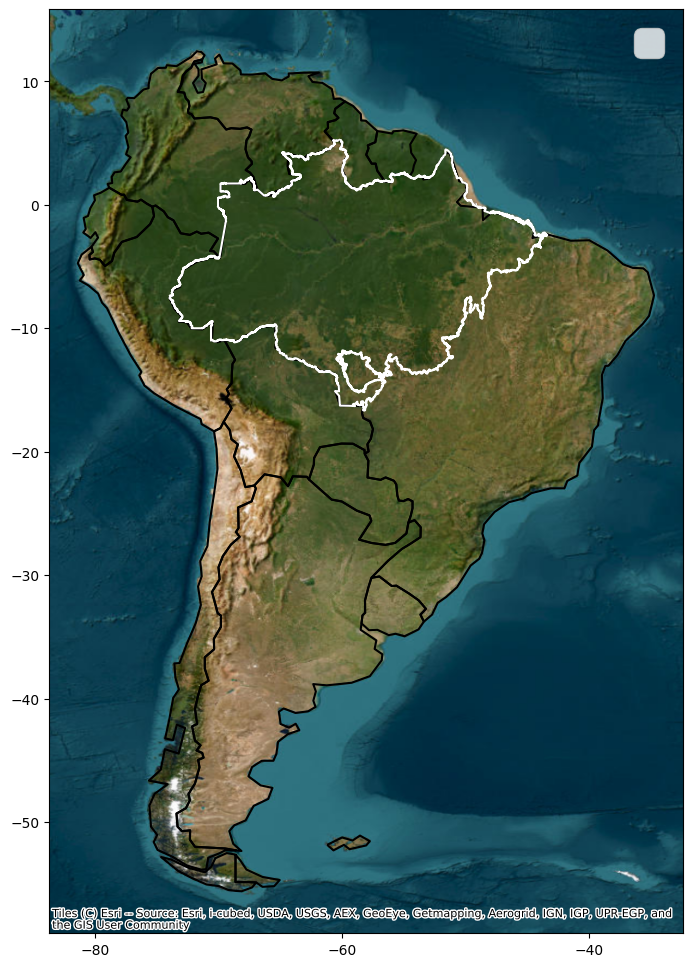

In [ ]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
al = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')
gdf = gpd.read_file('results/gdf_corr_deforestation_flow_divided.shp')


fig, ax = plt.subplots(figsize=(12, 12))

ax = world.boundary[world.continent == 'South America'].plot(ax = ax, edgecolor='black')
ax = al.boundary.plot(ax = ax, edgecolor='white')
# ax = gdf.plot(
#     ax=ax,
#     legend=True,
#     color='blue',
#     markersize=8
# )
plt.rcParams.update({'font.size': 27})
cx.add_basemap(ax, crs=gdf.crs.to_string(), source = cx.providers.Esri.WorldImagery)
plt.grid(False)
plt.legend()

<ipython-input-106-b282a702765d>:27: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



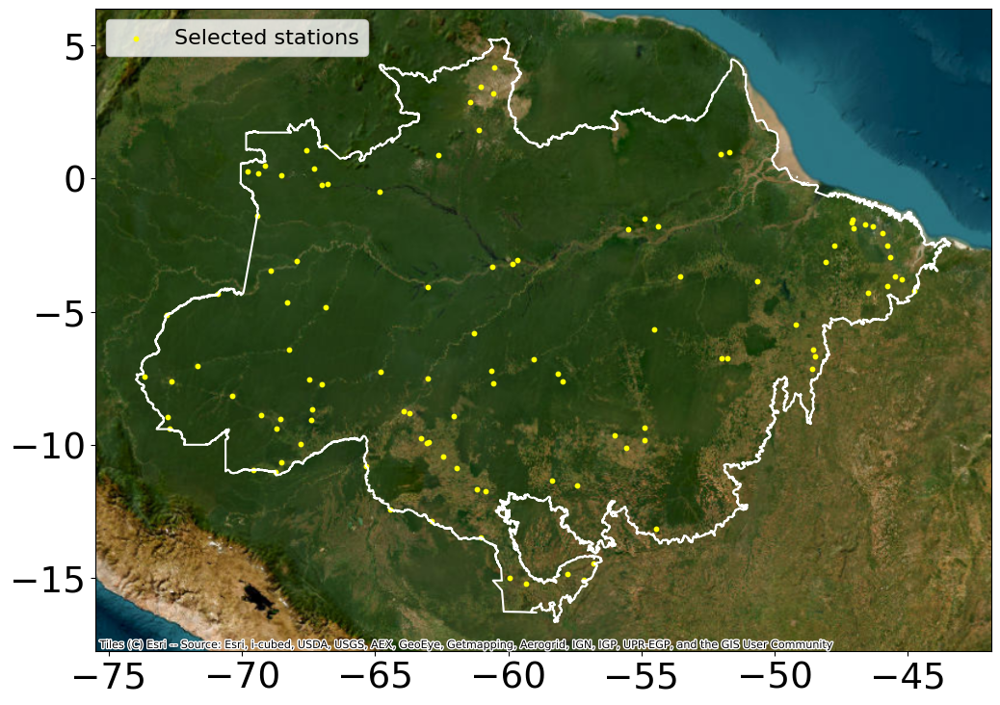

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

# Load your data
world = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')
gdf = gpd.read_file('results/gdf_corr_deforestation_flow_divided.shp')

world.crs = 4326
gdf.crs = 4326

# Create the figure and axes
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
plt.rcParams.update({'font.size': 16})

# Plot the world boundary
world.boundary.plot(ax=ax, edgecolor='white')

# Plot the selected stations as white circles
gdf.plot(ax=ax, color='yellow', markersize=10, marker='o', label='Selected stations')

# Add a basemap using contextily
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.Esri.WorldImagery)

# Customize the legend
legend = ax.legend(loc='upper left')
legend.legendHandles[0]._sizes = [10]  # Adjust the size of the legend marker

# Show the plot
plt.show()


In [ ]:
gdf = gpd.read_file('results/gdf_corr_deforestation_flow_divided.shp').rename(columns = {'Unnamed_ 0':'stations'})
df_defor = pd.read_excel('results/PERCENT_FOREST.xlsx').set_index('year')
df_perc_defor = pd.DataFrame(df_defor.iloc[0]-df_defor.iloc[-1])
df_perc_defor = df_perc_defor.rename(columns = {0:'perc_deforestation'})
gdf

,stations,correlatio,pvalue,Latitude,Longitude,geometry
0,station_10200000,-0.422531,0.028117,-5.1389,-72.8136,POINT (-72.81360 -5.13890)
1,station_10500000,0.081197,0.687234,-4.3408,-70.9056,POINT (-70.90560 -4.34080)
2,station_11400000,-0.121490,0.546076,-3.4569,-68.9119,POINT (-68.91190 -3.45690)
3,station_11500000,-0.131868,0.512045,-3.1017,-67.9356,POINT (-67.93560 -3.10170)
4,station_12100000,0.008547,0.966251,-4.6514,-68.3244,POINT (-68.32440 -4.65140)
...,...,...,...,...,...,...
102,station_33290000,0.097144,0.629784,-4.2194,-44.7653,POINT (-44.76530 -4.21940)
103,station_33380000,0.476190,0.012043,-3.7722,-45.2181,POINT (-45.21810 -3.77220)
104,station_66006000,0.090978,0.651769,-14.4517,-56.8142,POINT (-56.81420 -14.45170)
105,station_66010000,0.617616,0.000598,-15.0761,-57.1819,POINT (-57.18190 -15.07610)


In [ ]:
df_perc_defor = df_perc_defor.reset_index().rename(columns = {'index':'stations'})

In [ ]:
gdf = pd.merge(gdf, df_perc_defor, on='stations')

In [ ]:
gdf.to_file('results/gdf_corr_deforestation_flow_divided.shp')

<ipython-input-120-13b1af69fd2c>:1: UserWarning:

Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.



<ipython-input-121-7779d27d160a>:19: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



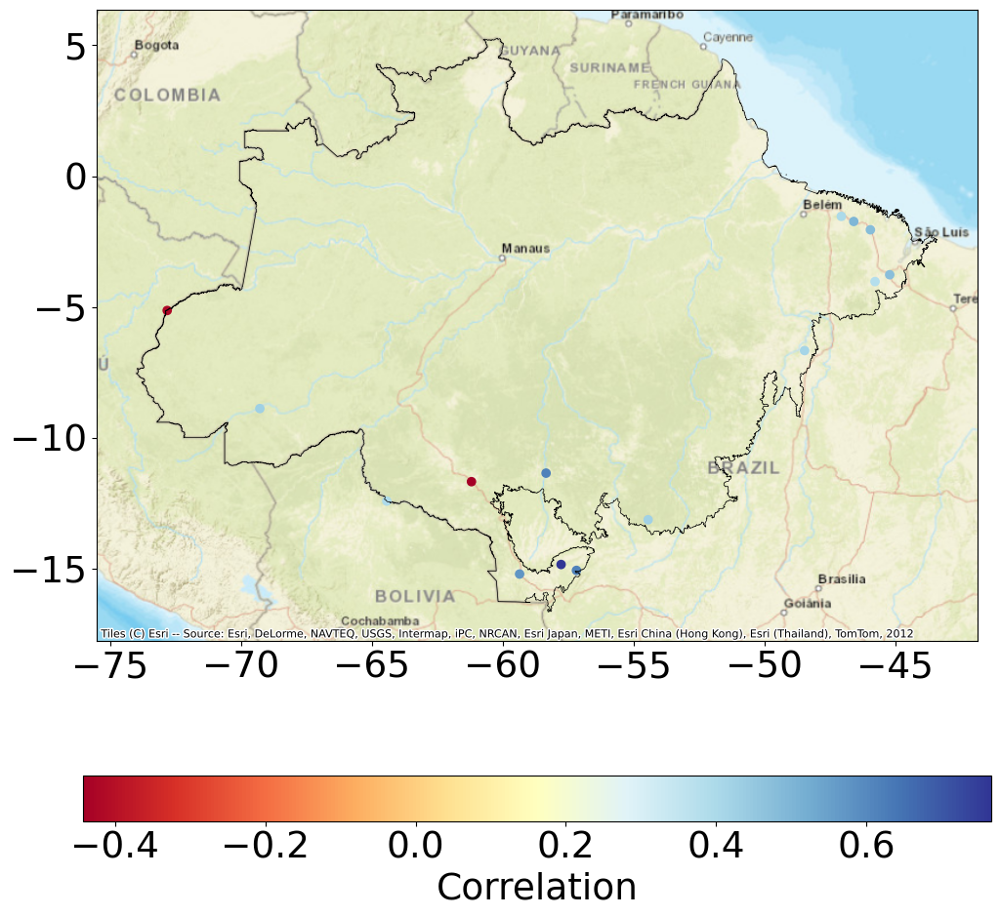

In [ ]:
import matplotlib.pyplot as plt

amazon_biome_border = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')
gdf = gpd.read_file('results/gdf_corr_deforestation_flow_divided.shp')
gdf_sig = gdf[gdf['pvalue'] < 0.05]
# gdf_pos_corr = gdf_sig[gdf_sig['correlatio'] > 0.0]
gdf_sig["markersize"] = gdf_sig[['correlatio']].astype(float)*5000
amazon_biome_border.crs = 4326
gdf_sig.crs = 4326

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
plt.rcParams.update({'font.size': 27})

ax = gdf_sig.plot(
    column="correlatio",
    # legend = True,
    ax=ax,
    # markersize="markersize",
    cmap = cm.get_cmap('RdYlBu'),
)
# Define the color bar
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='horizontal')
cbar.set_label("Correlation")

ax = amazon_biome_border.boundary.plot(ax=ax, edgecolor='black', linewidth = 0.5)
plt.grid(False)
cx.add_basemap(ax, crs = 'epsg:4326', source= cx.providers.Esri.WorldStreetMap)

plt.show()

<ipython-input-122-397150ae9cca>:17: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



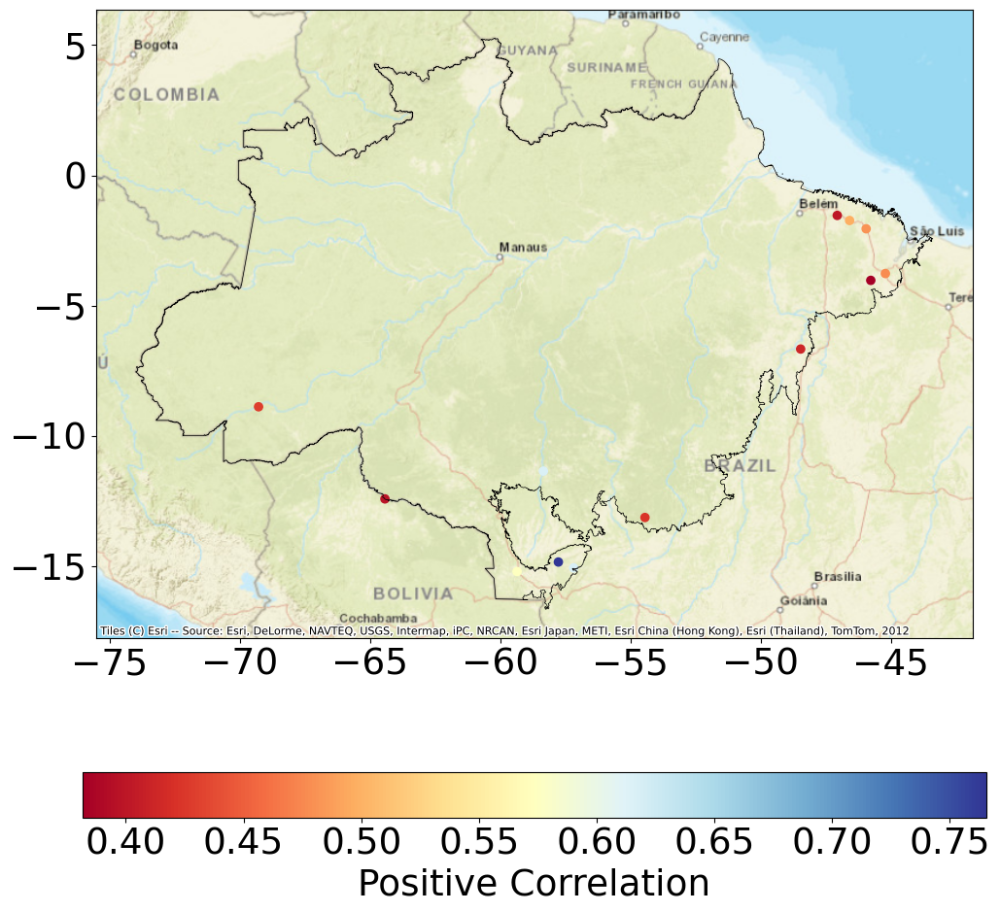

In [ ]:
amazon_biome_border = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')
gdf = gpd.read_file('results/gdf_corr_deforestation_flow_divided.shp')
gdf_sig = gdf[gdf['pvalue'] < 0.05]
gdf_pos_corr = gdf_sig[gdf_sig['correlatio'] > 0.0]
gdf_sig["markersize"] = gdf_sig[['correlatio']].astype(float)*5000
amazon_biome_border.crs = 4326
gdf_sig.crs = 4326

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
plt.rcParams.update({'font.size': 27})

ax = gdf_pos_corr.plot(
    column="correlatio",
    # legend = True,
    ax=ax,
    # markersize="markersize",
    cmap = cm.get_cmap('RdYlBu'),
)
# Define the color bar
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='horizontal')
cbar.set_label("Positive Correlation")

ax = amazon_biome_border.boundary.plot(ax=ax, edgecolor='black', linewidth = 0.5)
plt.grid(False)
cx.add_basemap(ax, crs = 'epsg:4326', source= cx.providers.Esri.WorldStreetMap)

plt.show()

<ipython-input-123-bd3ae259ff6e>:17: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



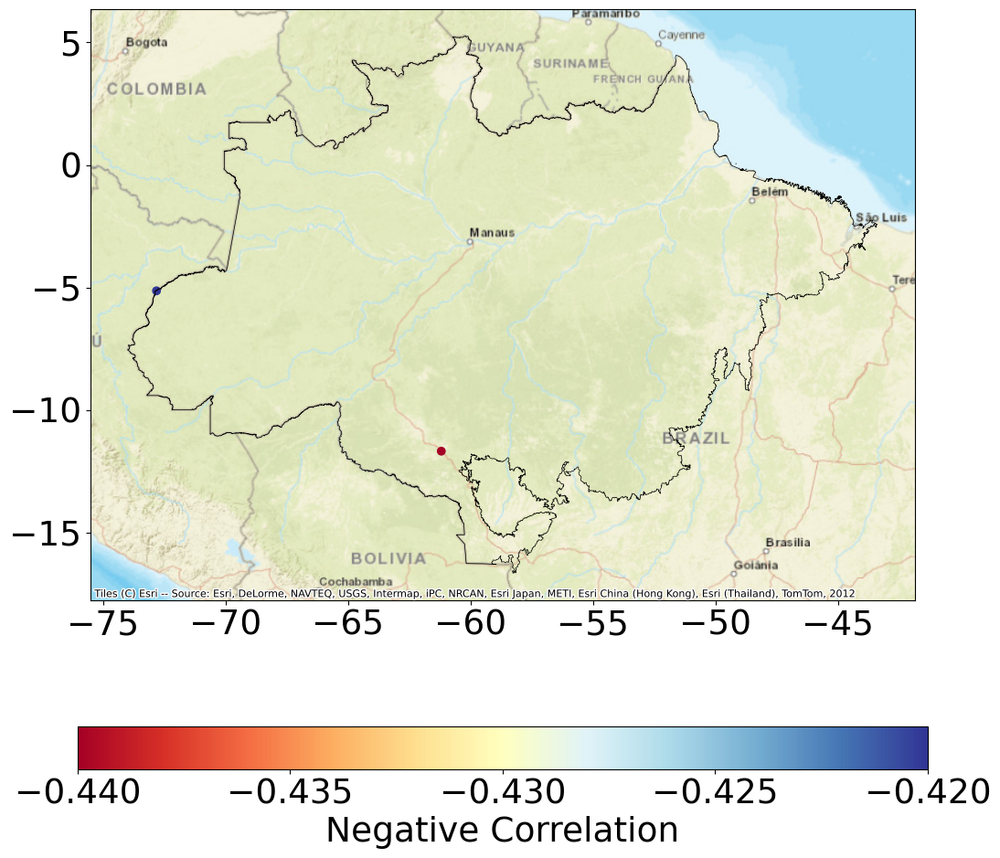

In [ ]:
amazon_biome_border = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')
gdf = gpd.read_file('results/gdf_corr_deforestation_flow_divided.shp')
gdf_sig = gdf[gdf['pvalue'] < 0.05]
gdf_neg_corr = gdf_sig[gdf_sig['correlatio'] < 0.0].round(2)
gdf_sig["markersize"] = gdf_sig[['correlatio']].astype(float)*5000
amazon_biome_border.crs = 4326
gdf_sig.crs = 4326

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
plt.rcParams.update({'font.size': 27})

ax = gdf_neg_corr.plot(
    column="correlatio",
    # legend = True,
    ax=ax,
    # markersize="markersize",
    cmap = cm.get_cmap('RdYlBu'),
)
# Define the color bar
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='horizontal')
cbar.set_label("Negative Correlation")

ax = amazon_biome_border.boundary.plot(ax=ax, edgecolor='black', linewidth = 0.5)
plt.grid(False)
cx.add_basemap(ax, crs = 'epsg:4326', source= cx.providers.Esri.WorldStreetMap)

plt.show()

##**Create geodataframes**

In [ ]:
stations_codes_lat_long_gdf = gpd.read_file('results/stations_within_area_of_interest_AMAZON_BIOME.gpkg', driver='GPKG')
df_mk_deforestation = pd.read_csv('results/MK_SS_deforestation_percent.csv').rename(columns = {'Unnamed: 0':'code'})
df_mk_ss_flow = pd.read_csv('results/mannKendall_SensSole_flow_divided_mice.csv').rename(columns = {'Unnamed: 0':'code'}).T

In [ ]:
df_mk_ss_flow.columns=df_mk_ss_flow.iloc[0]
df_mk_ss_flow=df_mk_ss_flow[1:].reset_index().rename(columns = {'index':'code'})
df_mk_ss_flow

code,code,MK_trend,MK_pvalue,Zmk_value,MK_slope
0,station_10200000,no trend,0.6163750034803586,0.5009944861104981,0.0758146458821104
1,station_10500000,no trend,0.23929351176558455,1.1767544906316352,1.4763544773075117
2,station_11400000,no trend,0.2211942719822526,1.2233586288744722,3.5065766625833
3,station_11500000,increasing,0.027662092362924717,2.20204553197405,19.724554272189984
4,station_12100000,no trend,0.23929351176558455,1.1767544906316352,0.4794954127550772
...,...,...,...,...,...
102,station_33290000,no trend,0.17282861084833234,-1.3631710436029834,-2.0210603356420744
103,station_33380000,no trend,0.6495478982562364,-0.45439034786766114,-0.09968720689616123
104,station_66006000,decreasing,0.011462469375363327,-2.5282744996739095,-2.592118551316859
105,station_66010000,decreasing,0.00937191589417119,-2.598180707038165,-0.3249480997409244


In [ ]:
# df_mk_deforestation = df_mk_deforestation.loc[df_mk_ss_precipitation.index, :]
df_mk_ss_deforestation_flow = df_mk_deforestation.join(df_mk_ss_flow, rsuffix = '_flow')

In [ ]:
df_defor = pd.read_excel('results/PERCENT_FOREST.xlsx').rename(columns = {'year':''}).set_index('').T
df_defor.columns = df_defor.columns.map(lambda x: 'year_' + str(x))
df_defor['percent_deforestation'] = df_defor['year_1985']-df_defor['year_2020']
df_defor = df_defor.reset_index().rename(columns = {'index':'code'})
df_defor = df_defor[['code', 'percent_deforestation']]
df_mk_ss_deforestation_flow = pd.merge(df_mk_ss_deforestation_flow, df_defor, on='code')
df_mk_ss_deforestation_flow

,code,MK_trend,MK_pvalue,Zmk_value,MK_slope,code_flow,MK_trend_flow,MK_pvalue_flow,Zmk_value_flow,MK_slope_flow,percent_deforestation
0,station_10200000,no trend,2.474296e-01,1.156615,0.001119,station_10200000,no trend,0.6163750034803586,0.5009944861104981,0.0758146458821104,-0.003517
1,station_10500000,increasing,7.334682e-09,5.783076,0.004358,station_10500000,no trend,0.23929351176558455,1.1767544906316352,1.4763544773075117,-0.131203
2,station_11400000,decreasing,2.297496e-12,-7.015123,-0.018272,station_11400000,no trend,0.2211942719822526,1.2233586288744722,3.5065766625833,0.656489
3,station_11500000,no trend,1.910504e-01,-1.307478,-0.003128,station_11500000,increasing,0.027662092362924717,2.20204553197405,19.724554272189984,0.140037
4,station_12100000,decreasing,2.158251e-03,-3.067545,-0.000829,station_12100000,no trend,0.23929351176558455,1.1767544906316352,0.4794954127550772,0.042345
...,...,...,...,...,...,...,...,...,...,...,...
102,station_33290000,decreasing,2.278207e-06,-4.727036,-0.224591,station_33290000,no trend,0.17282861084833234,-1.3631710436029834,-2.0210603356420744,19.000308
103,station_33380000,decreasing,2.537970e-13,-7.316849,-0.940988,station_33380000,no trend,0.6495478982562364,-0.45439034786766114,-0.09968720689616123,40.572258
104,station_66006000,decreasing,1.289045e-03,-3.218408,-0.274597,station_66006000,decreasing,0.011462469375363327,-2.5282744996739095,-2.592118551316859,6.464150
105,station_66010000,decreasing,1.289045e-03,-3.218408,-0.199734,station_66010000,decreasing,0.00937191589417119,-2.598180707038165,-0.3249480997409244,7.894969


In [ ]:
df_mk_ss_deforestation_flow.to_csv('results/df_mk_ss_deforestation_flow_divided.csv')

In [ ]:
CrosstabResult=pd.crosstab(index=df_mk_ss_deforestation_flow['MK_trend'],columns=df_mk_ss_deforestation_flow['MK_trend_flow'])
CrosstabResult

MK_trend_flow,decreasing,increasing,no trend
MK_trend,,,
decreasing,9,15,64
increasing,0,2,12
no trend,2,1,2


In [ ]:
stations_codes_lat_long_gdf_= stations_codes_lat_long_gdf.set_index(df_mk_ss_deforestation_flow.index)
stations_codes_lat_long_gdf_.drop('Code',axis='columns', inplace=True)

In [ ]:
gdf_df_mk_ss_deforestation_flow = df_mk_ss_deforestation_flow.join(stations_codes_lat_long_gdf_)
gdf_df_mk_ss_deforestation_flow
gdf_df_mk_ss_deforestation_flow.to_csv('results/gdf_df_mk_ss_deforestation_flow_divided.csv')
gdf_df_mk_ss_deforestation_flow = gpd.geodataframe.GeoDataFrame(gdf_df_mk_ss_deforestation_flow)
gdf_df_mk_ss_deforestation_flow.to_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')

<ipython-input-131-c086af930481>:5: UserWarning:

Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.



In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
import matplotlib.lines as mlines
import pandas as pd
!pip install contextily
import contextily as cx

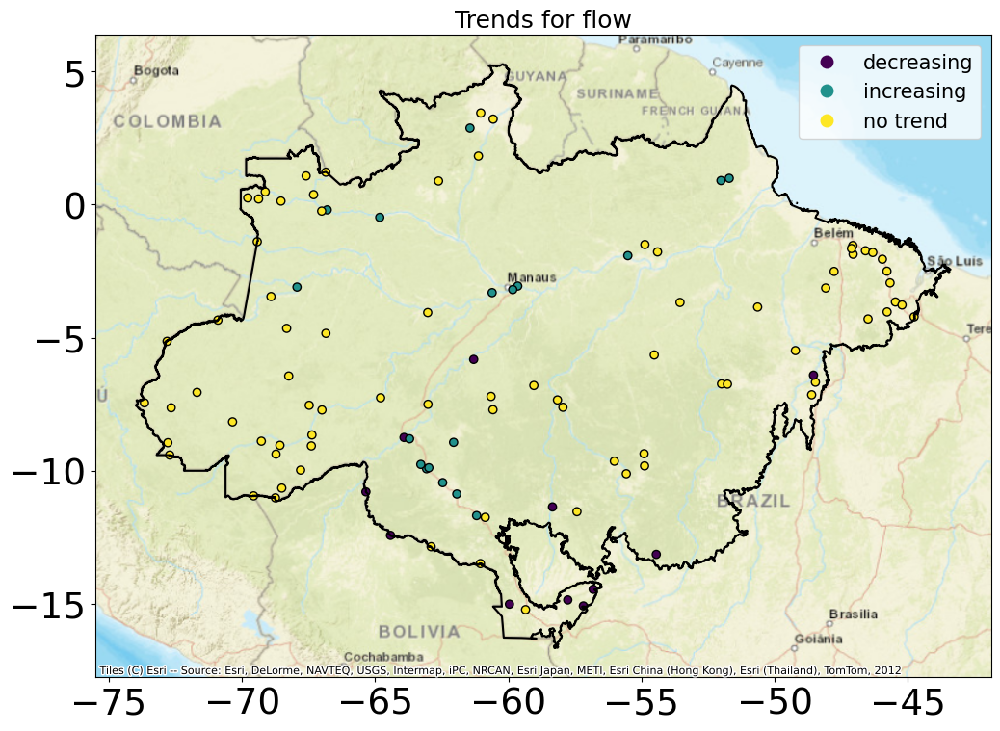

In [ ]:
# Read the point GeoDataFrame
gdf_df_mk_ss_deforestation_flow = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
world = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')

gdf_df_mk_ss_deforestation_flow['MK_pvalue_'] = gdf_df_mk_ss_deforestation_flow['MK_pvalue_'].astype(float)

# gdf_df_mk_ss_deforestation_flow = gdf_df_mk_ss_deforestation_flow[gdf_df_mk_ss_deforestation_flow['MK_pvalue_' ] < 0.05]

world.crs = 4326
gdf_df_mk_ss_deforestation_flow.crs = 4326

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ax = world.boundary.plot(ax=ax, edgecolor='black')

plt.rcParams.update({'font.size': 15})

ax = gdf_df_mk_ss_deforestation_flow.plot(column='MK_trend_f', categorical=True, cmap='viridis', edgecolor='black',
         legend=True, ax=ax)

#plt.savefig('images/rhodesia_land_classes.png',dpi=300)
plt.title("Trends for flow")

ax = amazon_biome_border.boundary.plot(ax=ax, edgecolor='black', linewidth = 0.5)
plt.grid(False)
cx.add_basemap(ax, crs = 'epsg:4326', source= cx.providers.Esri.WorldStreetMap)

In [ ]:
gdf_df_mk_ss_deforestation_flow = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
gdf_df_mk_ss_deforestation_flow['MK_pvalue_'] = gdf_df_mk_ss_deforestation_flow['MK_pvalue_'].astype(float)
gdf_sig  = gdf_df_mk_ss_deforestation_flow[gdf_df_mk_ss_deforestation_flow['MK_pvalue_'] <= 0.5]
gdf_sig[gdf_sig['MK_trend_f'] == 'increasing'].describe()

,MK_pvalue,Zmk_value,MK_slope,MK_pvalue_,percent_de,Latitude,Longitude
count,1.800000e+01,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000
mean,1.162760e-02,-5.130047,-0.536126,0.019044,19.248843,-5.045722,-61.168689
std,4.487525e-02,4.348407,0.568345,0.017601,19.857375,4.901921,4.349664
min,0.000000e+00,-8.825477,-1.614315,0.000023,-0.081239,-11.683600,-67.935600
25%,0.000000e+00,-8.234598,-1.016299,0.001797,0.383272,-9.855375,-63.233475
50%,4.259300e-11,-6.612822,-0.409603,0.015382,13.434348,-3.253350,-61.995600
75%,1.724774e-06,-3.161834,-0.012492,0.034468,36.106905,-0.841225,-60.027550
max,1.910504e-01,5.405919,0.003266,0.048950,55.268623,2.870800,-51.706400


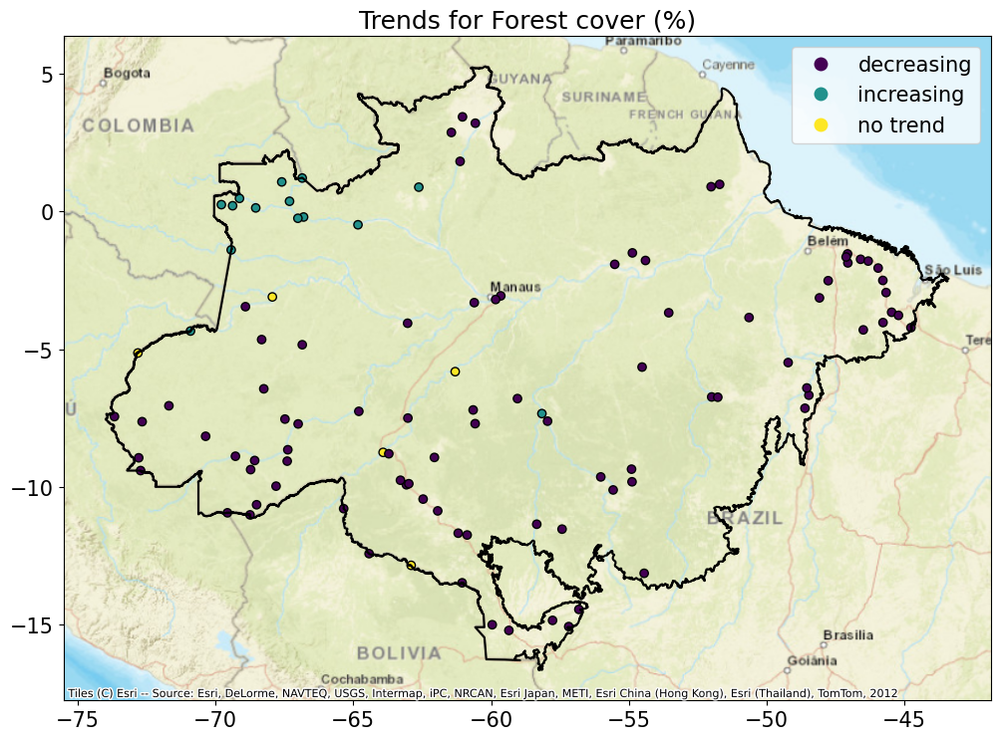

In [ ]:
# Read the point GeoDataFrame
import matplotlib.pyplot as plt
gdf_df_mk_ss_deforestation_precipitation = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
world = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')

gdf_df_mk_ss_deforestation_precipitation['MK_pvalue'] = gdf_df_mk_ss_deforestation_precipitation['MK_pvalue'].astype(float)

# gdf_df_mk_ss_deforestation_precipitation = gdf_df_mk_ss_deforestation_precipitation[gdf_df_mk_ss_deforestation_precipitation['MK_pvalue' ] < 0.05]

world.crs = 4326
gdf_df_mk_ss_deforestation_precipitation.crs = 4326

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ax = world.boundary.plot(ax=ax, edgecolor='black')

plt.rcParams.update({'font.size': 15})

ax = gdf_df_mk_ss_deforestation_precipitation.plot(column='MK_trend', categorical=True, cmap='viridis',edgecolor='black',
         legend=True, ax=ax)

#plt.savefig('images/rhodesia_land_classes.png',dpi=300)
plt.title("Trends for Forest cover (%)")

ax = amazon_biome_border.boundary.plot(ax=ax, edgecolor='black', linewidth = 0.5)
plt.grid(False)
cx.add_basemap(ax, crs = 'epsg:4326', source= cx.providers.Esri.WorldStreetMap)

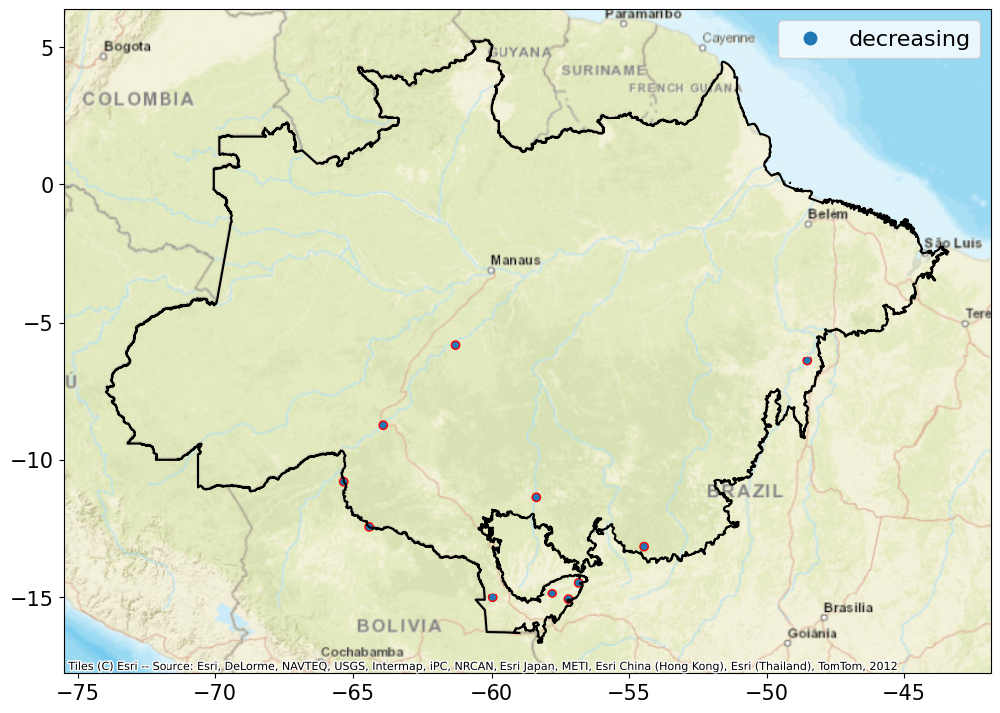

In [ ]:
# Read the point GeoDataFrame
gdf_df_mk_ss_deforestation_flow = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
world = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')

gdf_df_mk_ss_deforestation_flow['MK_pvalue_'] = gdf_df_mk_ss_deforestation_flow['MK_pvalue_'].astype(float)

gdf_df_mk_ss_deforestation_flow = gdf_df_mk_ss_deforestation_flow[gdf_df_mk_ss_deforestation_flow['MK_pvalue_' ] < 0.05]
gdf_df_mk_ss_deforestation_flow = gdf_df_mk_ss_deforestation_flow[gdf_df_mk_ss_deforestation_flow['MK_trend_f' ]  == 'decreasing']

world.crs = 4326
gdf_df_mk_ss_deforestation_flow.crs = 4326

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ax = world.boundary.plot(ax=ax, edgecolor='black')

plt.rcParams.update({'font.size': 16})

ax = gdf_df_mk_ss_deforestation_flow.plot(column='MK_trend_f', categorical=True, edgecolor='red',
         legend=True, ax=ax)

#plt.savefig('images/rhodesia_land_classes.png',dpi=300)

ax = amazon_biome_border.boundary.plot(ax=ax, edgecolor='black', linewidth = 0.5)
plt.grid(False)
cx.add_basemap(ax, crs = 'epsg:4326', source= cx.providers.Esri.WorldStreetMap)

##**Plot time series**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
df_date = pd.read_csv('results/df_flow_data_columns_equal_df_defor_divided.csv')#.drop(columns = ['Unnamed: 0.1',	'Unnamed: 0'])#.iloc[:,180:]
df_date

,date,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
0,1981-01-01,NaN,2.049030,6.190559,16.621741,NaN,NaN,NaN,2.744323,0.621451,...,0.002475,NaN,0.000438,0.000325,0.006094,0.491544,0.010483,2.173916,0.198697,2.684635
1,1981-01-02,NaN,2.001363,6.076906,16.428069,NaN,NaN,NaN,2.547311,0.567951,...,0.002742,NaN,0.000456,0.000400,0.006290,0.502824,0.010713,3.191074,0.192335,2.881919
2,1981-01-03,NaN,1.951357,6.048731,16.270279,NaN,NaN,NaN,2.547311,0.518957,...,0.003074,NaN,0.000512,0.000370,0.006290,0.498265,0.011653,3.224256,0.185476,2.910442
3,1981-01-04,NaN,1.798843,6.013622,16.113146,NaN,NaN,NaN,3.105329,0.483495,...,0.003361,NaN,0.000573,0.000406,0.007185,0.493784,0.014381,3.092338,0.186044,2.967738
4,1981-01-05,NaN,1.638091,5.936911,15.956634,NaN,NaN,NaN,4.561305,0.650315,...,0.003715,NaN,0.000573,0.000376,0.007625,0.491544,0.015688,2.994843,0.208073,3.594576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,2020-12-27,0.316512,2.841929,7.311253,20.208390,1.605096,0.201175,0.159264,14.429607,1.757491,...,0.019338,0.000999,0.002166,0.001724,0.042651,0.491080,0.035311,0.543833,NaN,0.992726
14606,2020-12-28,0.296428,2.851489,7.356800,20.361657,1.653419,0.182231,0.238755,17.542654,2.547518,...,0.018853,0.000903,0.002166,0.001586,0.042480,0.493861,0.043246,0.855610,NaN,0.941446
14607,2020-12-29,0.281190,2.873846,7.349191,20.438470,1.702334,0.165614,0.208317,15.397859,3.239894,...,0.016654,0.000903,0.002166,0.001372,0.041475,0.496566,0.045317,0.670131,NaN,0.901052
14608,2020-12-30,0.271030,2.873846,7.334005,20.476910,1.754759,0.164843,0.185616,6.864517,3.915043,...,0.014858,0.000903,0.002166,0.001189,0.039170,0.499347,0.038544,0.528592,NaN,0.901052


In [ ]:
df = pd.read_csv('results/df_flow_data_divided_mice_imputed.csv').drop(columns = 'Unnamed: 0')
df
df['date'] = df_date['date']
df
df.to_csv('results/df_flow_data_divided_mice_imputed.csv')

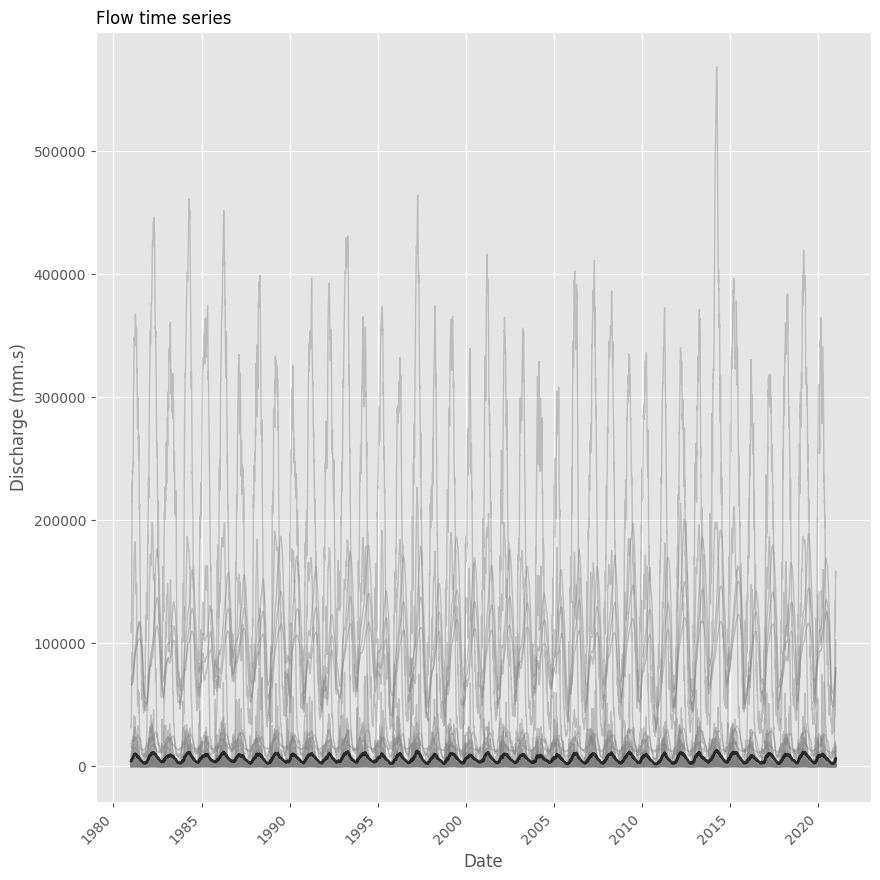

In [ ]:
df = pd.read_csv('results/df_flow_data_divided_mice_imputed.csv').drop(columns = 'Unnamed: 0')

df['date'] = pd.to_datetime(df['date'], format = '%Y-%m-%d')
df = df.set_index('date')
df['df_mean'] = df.mean(axis = 1)
# df = df.groupby(pd.Grouper(freq = 'M')).mean()
df = df.applymap(lambda x: x * 1000)#* 24 * 3600 * 30

# Change the style of plot
plt.style.use('ggplot')

# set figure size
plt.figure(figsize=(10,10))

# plot multiple lines
for column in df:
    plt.plot(df.index, df[column], marker='', color='grey', linewidth=1, alpha=0.4)

# Now re do the interesting curve, but biger with distinct color
plt.plot(df.index, df['df_mean'], marker='', color='black', linewidth=2, alpha=0.7)

# Add titles
plt.title("Flow time series", loc='left', fontsize=12, fontweight=0, color='black')
plt.xlabel("Date")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Discharge (mm.s)")

# Show the graph
plt.show()

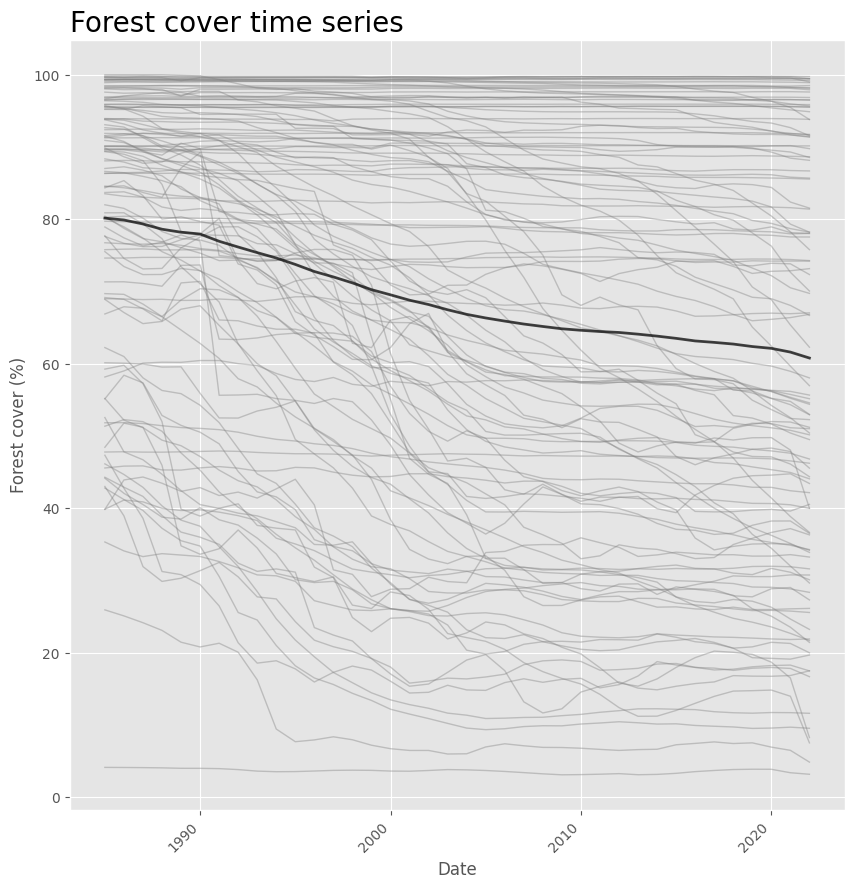

In [ ]:
df_defor = pd.read_excel('results/PERCENT_FOREST.xlsx').rename(columns = {'year':''}).set_index('')
df_defor['df_mean'] = df_defor.mean(axis = 1)

# Change the style of plot
plt.style.use('ggplot')

# set figure size
plt.figure(figsize=(10,10))

# plot multiple lines
for column in df_defor:
    plt.plot(df_defor.index, df_defor[column], marker='', color='grey', linewidth=1, alpha=0.4)

# Now re do the interesting curve, but biger with distinct color
plt.plot(df_defor.index, df_defor['df_mean'], marker='', color='black', linewidth=2, alpha=0.7)

# Add titles
plt.title("Forest cover time series", loc='left', fontsize=20, fontweight=0, color='black')
plt.xticks(rotation=45, ha='right')
plt.xlabel("Date")
plt.ylabel("Forest cover (%)")
plt.rcParams.update({'font.size': 37})

# Show the graph
plt.show()

Text(0.5, 0, 'Latitude')

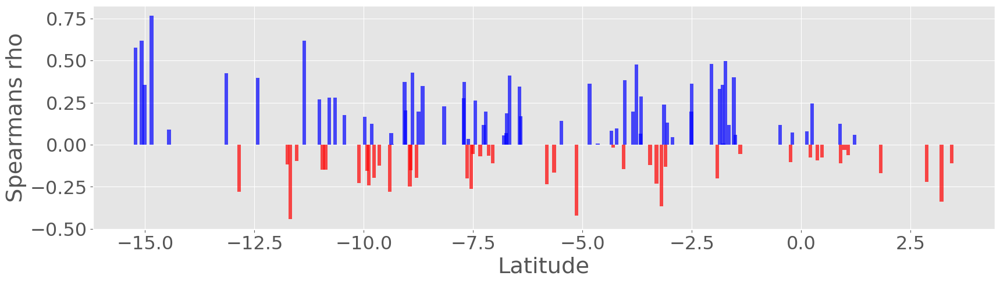

In [ ]:
# !pip install geopandas
import geopandas as gpd
gdf = gpd.read_file('results/gdf_corr_deforestation_flow_divided.shp')
# gdf = gdf[gdf['pvalue'] < 0.05]
gdf.Latitude = gdf.Latitude
plt.figure(figsize=(20,5))
plt.rcParams.update({'font.size': 23})

def bar_color(df,color1,color2):
    return np.where(gdf.correlatio>0,color1,color2).T
plt.bar(gdf.Latitude, gdf.correlatio, color=bar_color(gdf.correlatio,'b','r'), width=1/12, linewidth=0.2, alpha=0.7)
plt.ylabel('Spearmans rho')
plt.xlabel('Latitude')

Text(0.5, 0, 'Latitude')

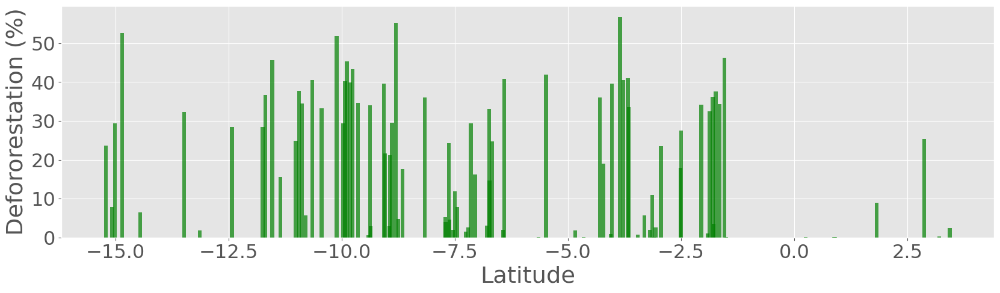

In [ ]:
gdf = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
gdf = gdf[gdf['percent_de'] > 0]
plt.figure(figsize=(20,5))
plt.rcParams.update({'font.size': 23})

def bar_color(df,color1,color2):
    return np.where(gdf.percent_de > 0,color1,color2).T
plt.bar(gdf.Latitude, gdf.percent_de, color=bar_color(gdf.percent_de,'g','r'), width=1/12, linewidth=0.2, alpha=0.7)
plt.ylabel('Defororestation (%)')
plt.xlabel('Latitude')

##**SLOPE x DEFORESTATION**


<ipython-input-145-a0cc2e60c93a>:21: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning:

invalid value encountered in sqrt

<ipython-input-145-a0cc2e60c93a>:26: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



Text(0.5, 0, 'Slope (Discharge [m3.s.km2]) vs. deforestation (size of the circle)')

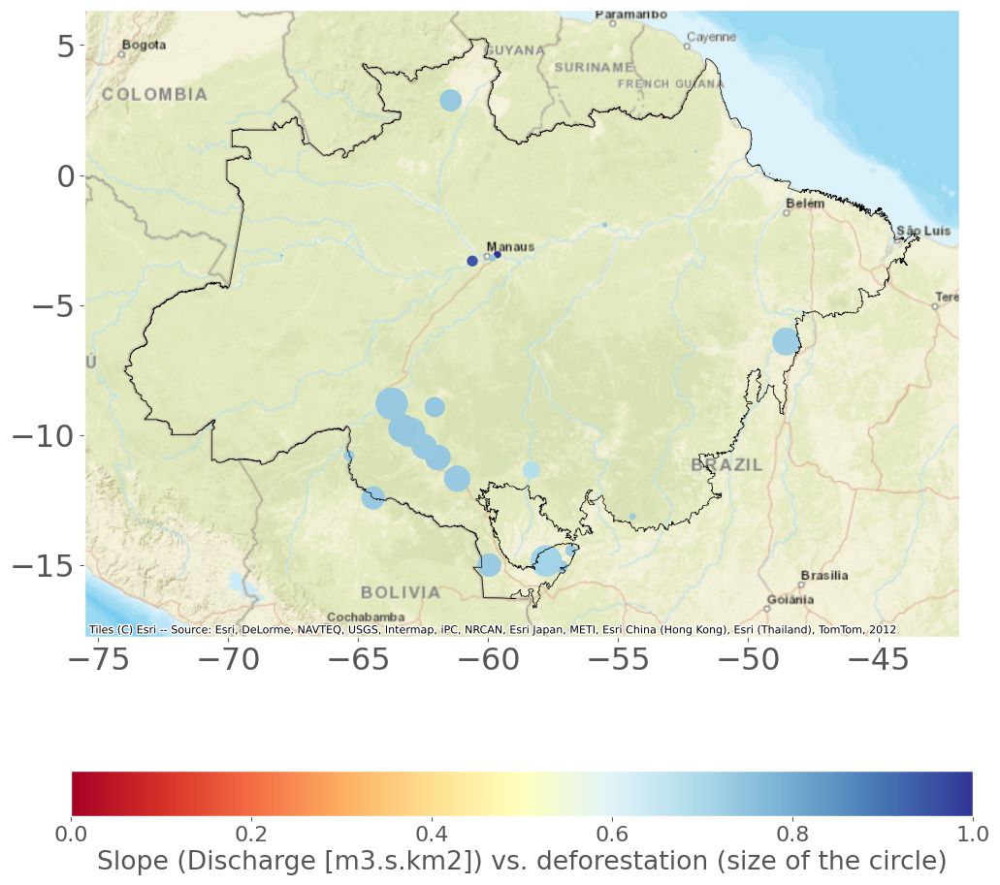

In [ ]:
import matplotlib.pyplot as plt
amazon_biome_border = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')
gdf = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
gdf['MK_pvalue_'] = gdf['MK_pvalue_'].astype(float)
gdf['MK_slope_f'] = gdf['MK_slope_f'].astype(float)

gdf_sig = gdf[gdf['MK_pvalue_'] < 0.05]

amazon_biome_border.crs = 4326
gdf_sig["markersize"] = gdf_sig[['percent_de']].astype(float)*10

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
plt.rcParams.update({'font.size': 16})
ax = amazon_biome_border.boundary.plot(ax=ax, edgecolor='black', linewidth = 0.5)

ax = gdf_sig.plot(
    column="MK_slope_f",
    #legend = True,
    ax=ax,
    markersize="markersize",
    cmap=cm.get_cmap('RdYlBu'),

)
plt.grid(False)
cx.add_basemap(ax, crs = 'epsg:4326', source= cx.providers.Esri.WorldStreetMap)
cbar = fig.colorbar(cm.ScalarMappable(cmap=cm.get_cmap('RdYlBu')), ax=ax, orientation = 'horizontal')
cbar.ax.set_xlabel('Slope (Discharge [m3.s.km2]) vs. deforestation (size of the circle)')

<ipython-input-146-6bf187785416>:30: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning:

invalid value encountered in sqrt

<ipython-input-146-6bf187785416>:35: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



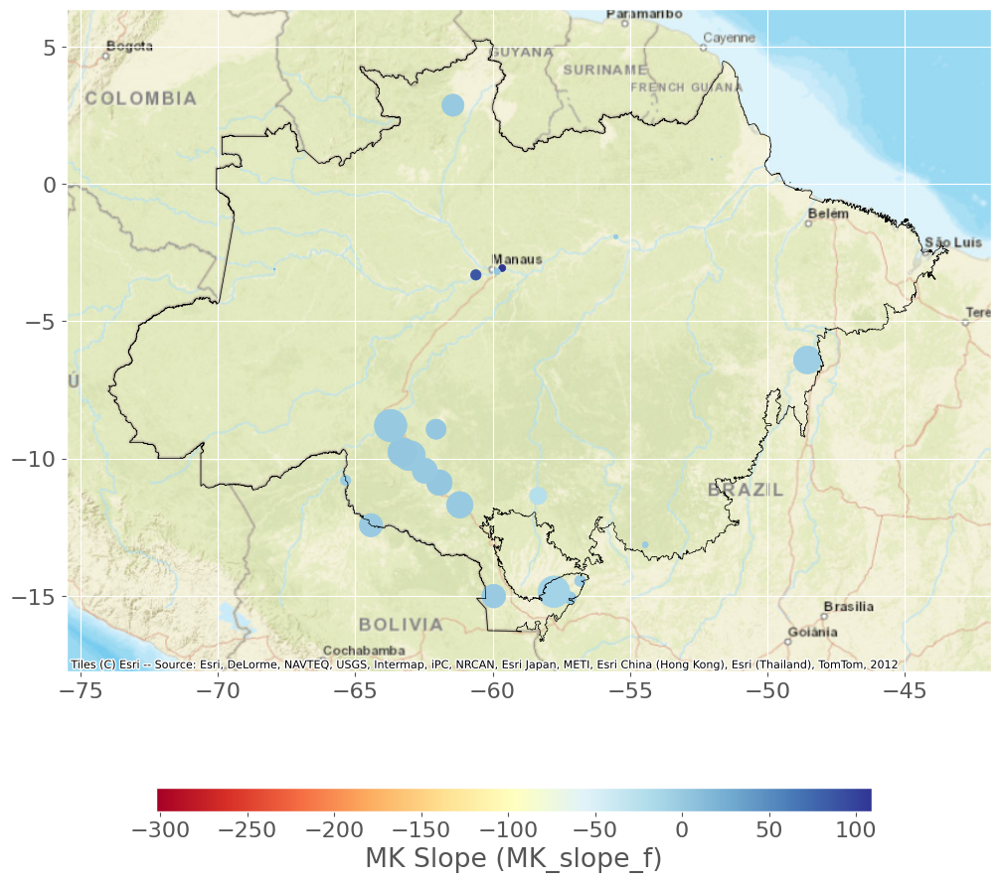

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import contextily as cx
from matplotlib import cm

# Load data
amazon_biome_border = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')
gdf = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
gdf['MK_pvalue_'] = gdf['MK_pvalue_'].astype(float)
gdf['MK_slope_f'] = gdf['MK_slope_f'].astype(float)

gdf_sig = gdf[gdf['MK_pvalue_'] < 0.05]

world.crs = 4326
gdf_sig["markersize"] = gdf_sig[['percent_de']].astype(float) * 10

# Create a figure and axis
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
plt.rcParams.update({'font.size': 16})

# Plot the Amazon biome boundary
ax = amazon_biome_border.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5)

# Plot the significant data points and add a legend
scatter = gdf_sig.plot(
    column="MK_slope_f",
    ax=ax,
    markersize="markersize",
    cmap=cm.get_cmap('RdYlBu'),
)

# Create a colorbar
norm = Normalize(vmin=gdf_sig['MK_slope_f'].min(), vmax=gdf_sig['MK_slope_f'].max())
sm = plt.cm.ScalarMappable(cmap=cm.get_cmap('RdYlBu'), norm=norm)
sm.set_array([])

# Create a horizontal colorbar
cax = fig.add_axes([0.2, 0.1, 0.6, 0.02])  # Adjust the position and size as needed
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label("MK Slope (MK_slope_f)")

# Add a basemap
cx.add_basemap(ax, crs='epsg:4326', source=cx.providers.Esri.WorldStreetMap)

# Remove the grid lines
plt.grid(False)

# Display the plot
plt.show()



Interpolation

In [ ]:
!pip install pykrige
!pip install rasterio
import pykrige.kriging_tools as kt
from pykrige.ok import OrdinaryKriging
import numpy as np
import geopandas as gpd
import rasterio


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 854.9/854.9 kB 9.6 MB/s eta 0:00:00


In [ ]:
gdf = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
area_of_interest = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')
# gdf[gdf['MK_slope_f'].astype(float)]
gdf

,code,MK_trend,MK_pvalue,Zmk_value,MK_slope,code_flow,MK_trend_f,MK_pvalue_,Zmk_value_,MK_slope_f,percent_de,Latitude,Longitude,geometry
0,station_10200000,no trend,2.474296e-01,1.156615,0.001119,station_10200000,no trend,0.6163750034803586,0.5009944861104981,0.0758146458821104,-0.003517,-5.1389,-72.8136,POINT (-72.81360 -5.13890)
1,station_10500000,increasing,7.334682e-09,5.783076,0.004358,station_10500000,no trend,0.23929351176558455,1.1767544906316352,1.4763544773075117,-0.131203,-4.3408,-70.9056,POINT (-70.90560 -4.34080)
2,station_11400000,decreasing,2.297000e-12,-7.015123,-0.018272,station_11400000,no trend,0.2211942719822526,1.2233586288744722,3.5065766625833,0.656489,-3.4569,-68.9119,POINT (-68.91190 -3.45690)
3,station_11500000,no trend,1.910504e-01,-1.307478,-0.003128,station_11500000,increasing,0.027662092362924717,2.20204553197405,19.724554272189984,0.140037,-3.1017,-67.9356,POINT (-67.93560 -3.10170)
4,station_12100000,decreasing,2.158251e-03,-3.067545,-0.000829,station_12100000,no trend,0.23929351176558455,1.1767544906316352,0.4794954127550772,0.042345,-4.6514,-68.3244,POINT (-68.32440 -4.65140)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,station_33290000,decreasing,2.278207e-06,-4.727036,-0.224591,station_33290000,no trend,0.17282861084833234,-1.3631710436029834,-2.0210603356420744,19.000308,-4.2194,-44.7653,POINT (-44.76530 -4.21940)
103,station_33380000,decreasing,2.540000e-13,-7.316849,-0.940988,station_33380000,no trend,0.6495478982562364,-0.45439034786766114,-0.09968720689616123,40.572258,-3.7722,-45.2181,POINT (-45.21810 -3.77220)
104,station_66006000,decreasing,1.289045e-03,-3.218408,-0.274597,station_66006000,decreasing,0.011462469375363327,-2.5282744996739095,-2.592118551316859,6.464150,-14.4517,-56.8142,POINT (-56.81420 -14.45170)
105,station_66010000,decreasing,1.289045e-03,-3.218408,-0.199734,station_66010000,decreasing,0.00937191589417119,-2.598180707038165,-0.3249480997409244,7.894969,-15.0761,-57.1819,POINT (-57.18190 -15.07610)


In [ ]:
x = gdf['Longitude']
y = gdf['Latitude']
z = gdf['MK_slope_f'].values

# Define the grid where you want to interpolate the values
xmin, ymin, xmax, ymax = area_of_interest.total_bounds

grid_res = 0.05  # in meters
grid_x = np.arange(xmin, xmax + grid_res, grid_res)
grid_y = np.arange(ymin, ymax + grid_res, grid_res)
grid_xx, grid_yy = np.meshgrid(grid_x, grid_y)

# Perform the kriging
OK = OrdinaryKriging(x, y, z, variogram_model='gaussian')
z_interp, _ = OK.execute('grid', grid_x, grid_y)

# Save the interpolated values as a raster
transform = rasterio.transform.from_bounds(xmin, ymin, xmax, ymax, len(grid_x), len(grid_y))
profile = {'driver': 'GTiff', 'height': len(grid_y), 'width': len(grid_x), 'count': 1, 'dtype': rasterio.float64,
           'crs': rasterio.crs.CRS.from_epsg(4326), 'transform': transform}
with rasterio.open('interpolated_MK_slope_f.tif', 'w', **profile) as dst:
    dst.write(np.expand_dims(z_interp, axis=0))

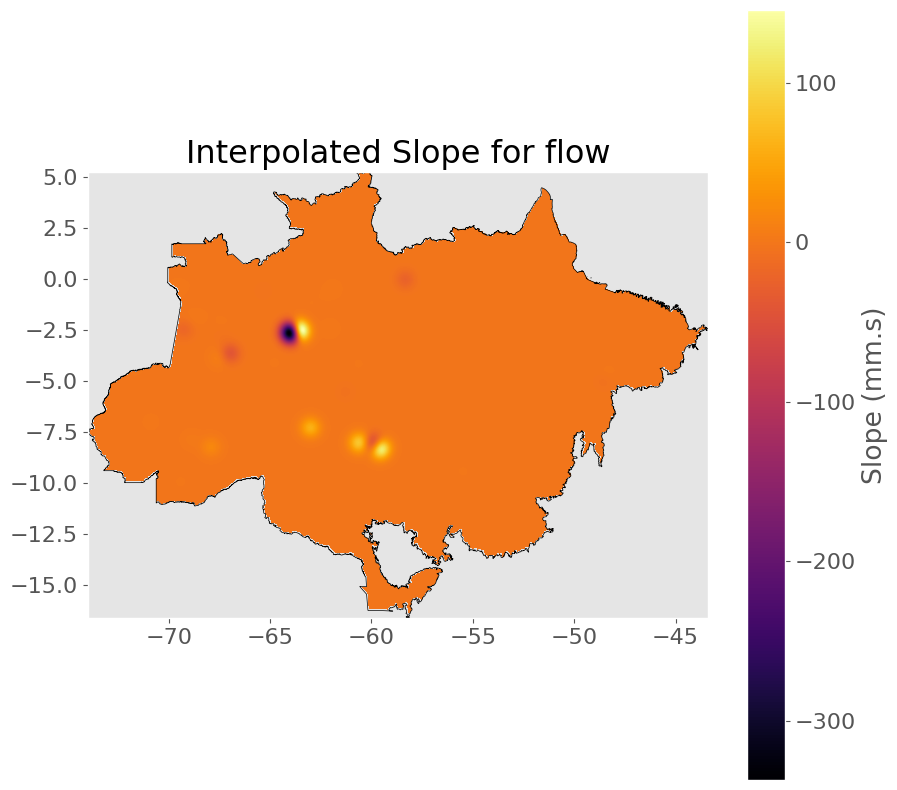

In [ ]:
import rasterio
from rasterio.mask import mask
from rasterio.plot import show

path_raster_rmse = r'interpolated_MK_slope_f.tif'

raster_rmse = rasterio.open(path_raster_rmse)

area_of_interest.crs = raster_rmse.crs

# Get the shapefile geometry
shapefile_geom = area_of_interest.geometry.values[0]

clipped_data, clipped_transform = mask(dataset=raster_rmse, shapes=[shapefile_geom], crop=True, nodata=255)

# Set nodata values to white
clipped_data[clipped_data == 255] = np.nan
clipped_data = np.ma.masked_where(np.isnan(clipped_data), clipped_data)

# Plot the raster
fig, ax = plt.subplots(figsize=(10, 10))
plt.rcParams.update({'font.size': 16})

show(clipped_data, transform=transform, ax=ax, cmap='inferno')
ax.set_title('Interpolated Slope for flow')
area_of_interest.plot(ax=ax, facecolor='none', edgecolor='black')

img = ax.get_images()[0]
cbar = plt.colorbar(img, ax=ax, orientation='vertical')
cbar.ax.set_ylabel('Slope (mm.s)')
plt.grid(False)
plt.show()

In [ ]:
gdf = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')
area_of_interest = gpd.read_file('/content/gdrive/MyDrive/Artigos/Buffer_defor_precip/shp/amazon_biome_border/amazon_biome_border.shp')

In [ ]:
x = gdf['Longitude']
y = gdf['Latitude']
z = gdf['MK_slope'].values

# Define the grid where you want to interpolate the values
xmin, ymin, xmax, ymax = area_of_interest.total_bounds

grid_res = 0.05  # in meters
grid_x = np.arange(xmin, xmax + grid_res, grid_res)
grid_y = np.arange(ymin, ymax + grid_res, grid_res)
grid_xx, grid_yy = np.meshgrid(grid_x, grid_y)

# Perform the kriging
OK = OrdinaryKriging(x, y, z, variogram_model='linear')
z_interp, _ = OK.execute('grid', grid_x, grid_y)

# Save the interpolated values as a raster
transform = rasterio.transform.from_bounds(xmin, ymin, xmax, ymax, len(grid_x), len(grid_y))
profile = {'driver': 'GTiff', 'height': len(grid_y), 'width': len(grid_x), 'count': 1, 'dtype': rasterio.float64,
           'crs': rasterio.crs.CRS.from_epsg(4326), 'transform': transform}
with rasterio.open('interpolated_MK_slope_deforestation_10000m.tif', 'w', **profile) as dst:
    dst.write(np.expand_dims(z_interp, axis=0))

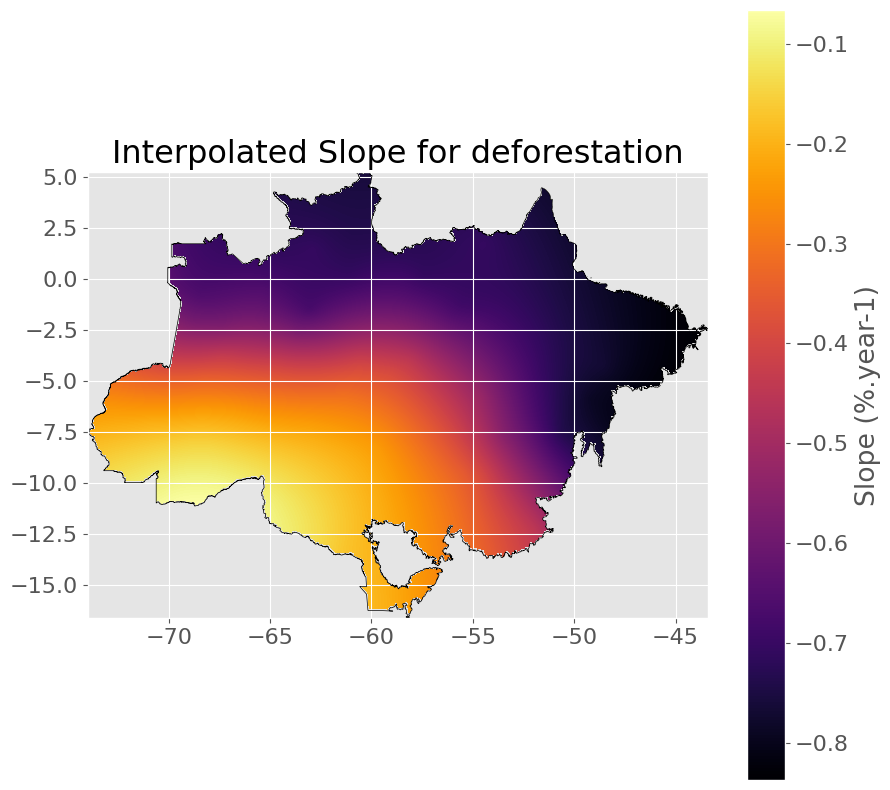

In [ ]:
import rasterio
from rasterio.mask import mask
from rasterio.plot import show

path_raster_rmse = r'interpolated_MK_slope_deforestation_10000m.tif'

raster_rmse = rasterio.open(path_raster_rmse)

area_of_interest.crs = raster_rmse.crs

# Get the shapefile geometry
shapefile_geom = area_of_interest.geometry.values[0]

clipped_data, clipped_transform = mask(dataset=raster_rmse, shapes=[shapefile_geom], crop=True, nodata=255)

# Set nodata values to white
clipped_data[clipped_data == 255] = np.nan
clipped_data = np.ma.masked_where(np.isnan(clipped_data), clipped_data)

# Plot the raster
fig, ax = plt.subplots(figsize=(10, 10))
plt.rcParams.update({'font.size': 16})

show(clipped_data, transform=transform, ax=ax, cmap='inferno')
ax.set_title('Interpolated Slope for deforestation')
area_of_interest.plot(ax=ax, facecolor='none', edgecolor='black')

img = ax.get_images()[0]
cbar = plt.colorbar(img, ax=ax, orientation='vertical')
cbar.ax.set_ylabel('Slope (%.year-1)')

plt.show()

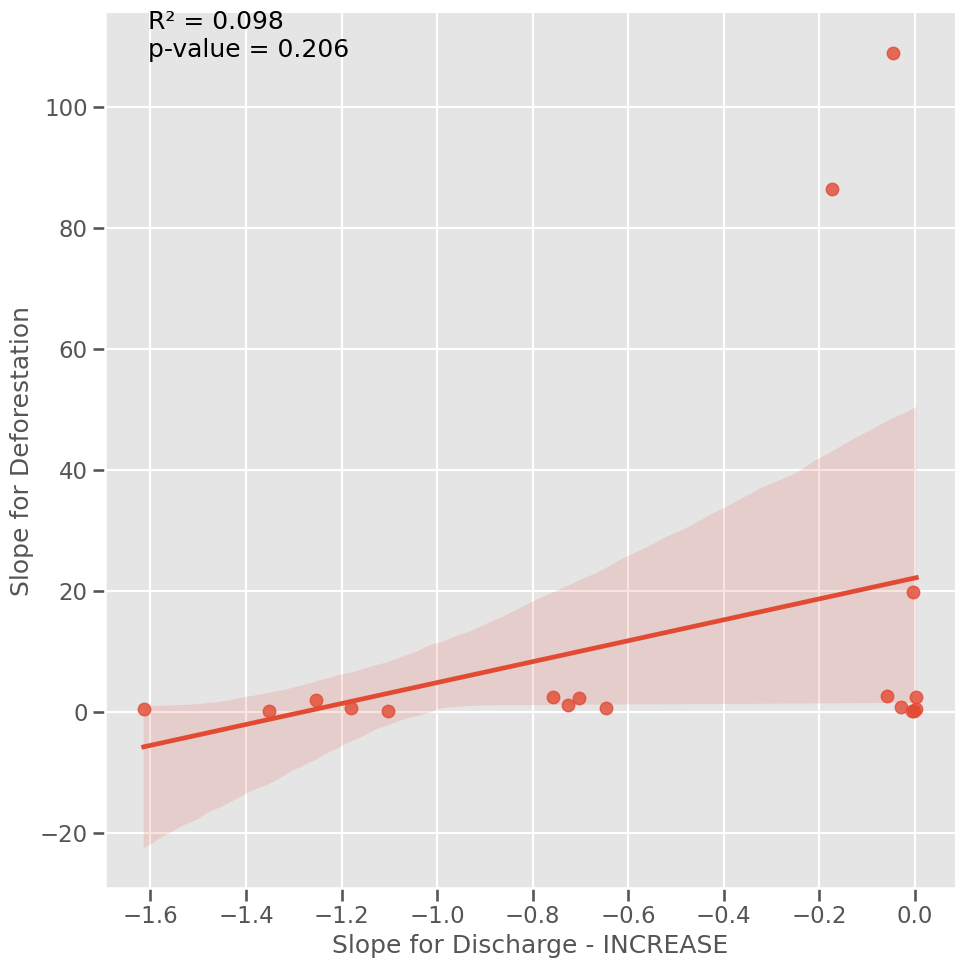

In [ ]:
import geopandas as gpd
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Set the global font size using sns.set_context()
sns.set_context("talk")

# Read the shapefile
gdf = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')

# Convert 'MK_slope' and 'MK_slope_f' columns to numeric with errors='coerce'
gdf['MK_slope'] = pd.to_numeric(gdf['MK_slope'], errors='coerce')
gdf['MK_slope_f'] = pd.to_numeric(gdf['MK_slope_f'], errors='coerce')

# Round the 'MK_slope' and 'MK_slope_f' columns to 3 decimal places
gdf['MK_slope'] = gdf['MK_slope'].round(3)
gdf['MK_slope_f'] = gdf['MK_slope_f'].round(3)

# Filter the DataFrame to include only increasing trends
increasing_trend_df = gdf[gdf['MK_trend_f'] == 'increasing']

# Create the scatter plot using Seaborn
lm = sns.lmplot(x="MK_slope",
               y="MK_slope_f",
               data=increasing_trend_df,
               height=10)

# Set the labels for the x and y axes
plt.xlabel("Slope for Discharge - INCREASE")
plt.ylabel("Slope for Deforestation")

# Calculate the regression statistics
x = increasing_trend_df['MK_slope']
y = increasing_trend_df['MK_slope_f']
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)

# Annotate the plot with R² and p-value
plt.text(0.05, 0.95, f"R² = {r_value**2:.3f}\np-value = {p_value:.3f}", transform=lm.ax.transAxes)

# Show the plot
plt.show()


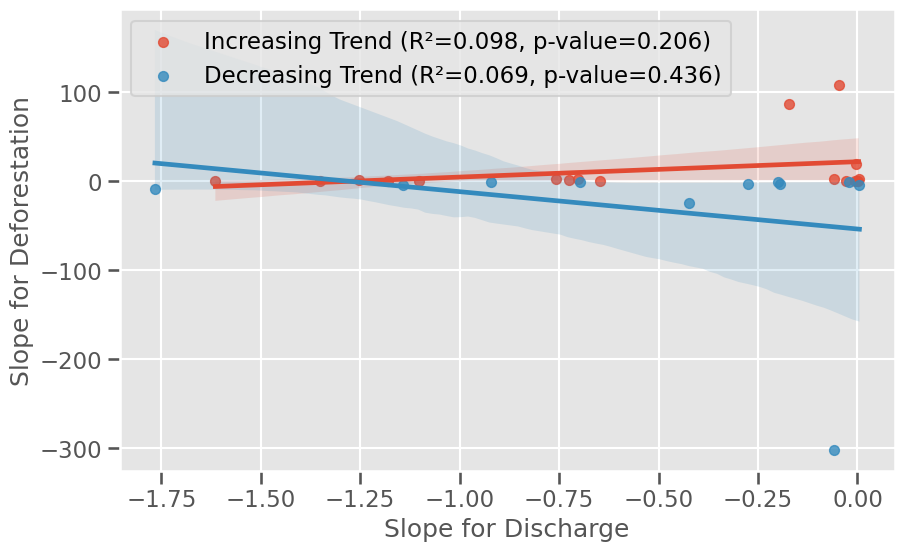

In [ ]:
import geopandas as gpd
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Read the shapefile
gdf = gpd.read_file('results/gdf_df_mk_ss_deforestation_flow_divided.shp')

# Convert 'MK_slope' and 'MK_slope_f' columns to numeric with errors='coerce'
gdf['MK_slope'] = pd.to_numeric(gdf['MK_slope'], errors='coerce')
gdf['MK_slope_f'] = pd.to_numeric(gdf['MK_slope_f'], errors='coerce')

# Round the 'MK_slope' and 'MK_slope_f' columns to 3 decimal places
gdf['MK_slope'] = gdf['MK_slope'].round(3)
gdf['MK_slope_f'] = gdf['MK_slope_f'].round(3)

# Filter the DataFrames for increasing and decreasing trends
increasing_trend_df = gdf[gdf['MK_trend_f'] == 'increasing']
decreasing_trend_df = gdf[gdf['MK_trend_f'] == 'decreasing']

# Create the scatter plots using Seaborn
plt.figure(figsize=(10, 6))  # Set the figure size

# Calculate regression statistics and annotate for increasing trend
x_increasing = increasing_trend_df['MK_slope']
y_increasing = increasing_trend_df['MK_slope_f']
slope_increasing, intercept_increasing, r_value_increasing, p_value_increasing, std_err_increasing = stats.linregress(x_increasing, y_increasing)

sns.regplot(x="MK_slope", y="MK_slope_f", data=increasing_trend_df, label=f'Increasing Trend (R²={r_value_increasing**2:.3f}, p-value={p_value_increasing:.3f})', scatter_kws={"s": 50})

# Calculate regression statistics and annotate for decreasing trend
x_decreasing = decreasing_trend_df['MK_slope']
y_decreasing = decreasing_trend_df['MK_slope_f']
slope_decreasing, intercept_decreasing, r_value_decreasing, p_value_decreasing, std_err_decreasing = stats.linregress(x_decreasing, y_decreasing)

sns.regplot(x="MK_slope", y="MK_slope_f", data=decreasing_trend_df, label=f'Decreasing Trend (R²={r_value_decreasing**2:.3f}, p-value={p_value_decreasing:.3f})', scatter_kws={"s": 50})

# Set the labels for the x and y axes
plt.xlabel("Slope for Discharge")
plt.ylabel("Slope for Deforestation")

# Add a legend
plt.legend()

# Show the plot
plt.show()


Panel data

In [ ]:
import pandas as pd
df_flow = pd.read_csv('results/df_flow_data_columns_equal_df_defor_divided.csv')

df_flow['date'] = pd.to_datetime(df_flow['date'], format = '%Y-%m-%d')
df_flow = df_flow.set_index(['date'])
df_flow = df_flow.loc['1985-01-01':'2020-12-31']
df_flow = df_flow.groupby(pd.Grouper(freq='Y')).median()
df_flow = df_flow.reset_index()

df_flow

,date,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
0,1985-12-31,0.194520,1.801526,5.826542,15.800746,0.448838,0.073410,0.052925,4.122385,0.963721,...,0.027641,0.019669,0.002117,0.001658,0.040993,0.825472,0.051494,0.737964,0.057775,2.118637
1,1986-12-31,0.198888,2.049030,6.570173,18.609558,0.532471,0.058761,0.051641,5.456424,0.966867,...,0.022346,0.016088,0.001673,0.001255,0.044833,0.701929,0.052414,0.641779,0.046766,2.142420
2,1987-12-31,0.249095,1.705917,6.660034,18.517211,0.647670,0.042957,0.024224,5.601270,0.616502,...,0.007233,0.005919,0.000948,0.000820,0.020755,0.496566,0.021786,0.632386,0.059065,1.910873
3,1988-12-31,0.167593,2.042004,6.240737,17.110003,0.485318,0.052934,0.036162,4.598518,0.745974,...,0.015126,0.009447,0.001433,0.000903,0.030250,0.599827,0.029997,1.437767,0.119343,2.431153
4,1989-12-31,0.229463,2.273100,7.548762,20.284974,0.480613,0.034460,0.039889,4.184188,0.820725,...,0.024786,0.015488,0.000659,0.001284,0.044625,0.586808,0.052156,0.686368,0.078319,2.168413
5,1990-12-31,0.246257,1.933455,7.067193,19.543480,0.369203,0.069483,0.051962,7.419597,1.157330,...,0.039403,0.004792,0.000291,0.000782,0.033081,0.507614,0.027131,0.564458,0.075114,2.022949
6,1991-12-31,0.246257,2.226421,6.371101,17.513816,0.562021,0.057731,0.045625,5.243103,0.948036,...,0.042641,0.032282,0.000533,0.000775,0.029134,0.469215,0.008494,1.004128,0.091057,2.936935
7,1992-12-31,0.231079,1.519395,5.302542,15.234573,0.388272,0.020706,0.038879,6.211741,0.906251,...,0.031926,0.001190,0.000291,0.000741,0.013609,0.442250,0.011712,1.084278,0.118052,NaN
8,1993-12-31,0.275150,2.743822,8.304662,21.565574,0.886007,0.095618,0.101469,6.830279,1.837472,...,0.007253,0.003464,0.000477,0.000690,0.014784,0.316699,0.008376,0.705907,0.082761,3.200022
9,1994-12-31,0.284031,2.278961,8.018500,21.037775,0.602082,0.066192,0.050057,5.624726,1.440557,...,0.022807,0.022825,0.001471,0.001316,0.054154,0.482813,0.045200,0.817674,0.064552,1.955242


In [ ]:
df_flow['date'] = pd.to_datetime(df_flow['date'], format = '%Y-%m-%d')
df_flow['date'] = df_flow['date'].dt.strftime('%Y')
df_flow

,date,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
0,1985,0.194520,1.801526,5.826542,15.800746,0.448838,0.073410,0.052925,4.122385,0.963721,...,0.027641,0.019669,0.002117,0.001658,0.040993,0.825472,0.051494,0.737964,0.057775,2.118637
1,1986,0.198888,2.049030,6.570173,18.609558,0.532471,0.058761,0.051641,5.456424,0.966867,...,0.022346,0.016088,0.001673,0.001255,0.044833,0.701929,0.052414,0.641779,0.046766,2.142420
2,1987,0.249095,1.705917,6.660034,18.517211,0.647670,0.042957,0.024224,5.601270,0.616502,...,0.007233,0.005919,0.000948,0.000820,0.020755,0.496566,0.021786,0.632386,0.059065,1.910873
3,1988,0.167593,2.042004,6.240737,17.110003,0.485318,0.052934,0.036162,4.598518,0.745974,...,0.015126,0.009447,0.001433,0.000903,0.030250,0.599827,0.029997,1.437767,0.119343,2.431153
4,1989,0.229463,2.273100,7.548762,20.284974,0.480613,0.034460,0.039889,4.184188,0.820725,...,0.024786,0.015488,0.000659,0.001284,0.044625,0.586808,0.052156,0.686368,0.078319,2.168413
5,1990,0.246257,1.933455,7.067193,19.543480,0.369203,0.069483,0.051962,7.419597,1.157330,...,0.039403,0.004792,0.000291,0.000782,0.033081,0.507614,0.027131,0.564458,0.075114,2.022949
6,1991,0.246257,2.226421,6.371101,17.513816,0.562021,0.057731,0.045625,5.243103,0.948036,...,0.042641,0.032282,0.000533,0.000775,0.029134,0.469215,0.008494,1.004128,0.091057,2.936935
7,1992,0.231079,1.519395,5.302542,15.234573,0.388272,0.020706,0.038879,6.211741,0.906251,...,0.031926,0.001190,0.000291,0.000741,0.013609,0.442250,0.011712,1.084278,0.118052,NaN
8,1993,0.275150,2.743822,8.304662,21.565574,0.886007,0.095618,0.101469,6.830279,1.837472,...,0.007253,0.003464,0.000477,0.000690,0.014784,0.316699,0.008376,0.705907,0.082761,3.200022
9,1994,0.284031,2.278961,8.018500,21.037775,0.602082,0.066192,0.050057,5.624726,1.440557,...,0.022807,0.022825,0.001471,0.001316,0.054154,0.482813,0.045200,0.817674,0.064552,1.955242


In [ ]:
df_flow['date'] = df_flow['date'].apply(lambda x: 'year_' + str(x))
df_flow

,date,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
0,year_1985,0.194520,1.801526,5.826542,15.800746,0.448838,0.073410,0.052925,4.122385,0.963721,...,0.027641,0.019669,0.002117,0.001658,0.040993,0.825472,0.051494,0.737964,0.057775,2.118637
1,year_1986,0.198888,2.049030,6.570173,18.609558,0.532471,0.058761,0.051641,5.456424,0.966867,...,0.022346,0.016088,0.001673,0.001255,0.044833,0.701929,0.052414,0.641779,0.046766,2.142420
2,year_1987,0.249095,1.705917,6.660034,18.517211,0.647670,0.042957,0.024224,5.601270,0.616502,...,0.007233,0.005919,0.000948,0.000820,0.020755,0.496566,0.021786,0.632386,0.059065,1.910873
3,year_1988,0.167593,2.042004,6.240737,17.110003,0.485318,0.052934,0.036162,4.598518,0.745974,...,0.015126,0.009447,0.001433,0.000903,0.030250,0.599827,0.029997,1.437767,0.119343,2.431153
4,year_1989,0.229463,2.273100,7.548762,20.284974,0.480613,0.034460,0.039889,4.184188,0.820725,...,0.024786,0.015488,0.000659,0.001284,0.044625,0.586808,0.052156,0.686368,0.078319,2.168413
5,year_1990,0.246257,1.933455,7.067193,19.543480,0.369203,0.069483,0.051962,7.419597,1.157330,...,0.039403,0.004792,0.000291,0.000782,0.033081,0.507614,0.027131,0.564458,0.075114,2.022949
6,year_1991,0.246257,2.226421,6.371101,17.513816,0.562021,0.057731,0.045625,5.243103,0.948036,...,0.042641,0.032282,0.000533,0.000775,0.029134,0.469215,0.008494,1.004128,0.091057,2.936935
7,year_1992,0.231079,1.519395,5.302542,15.234573,0.388272,0.020706,0.038879,6.211741,0.906251,...,0.031926,0.001190,0.000291,0.000741,0.013609,0.442250,0.011712,1.084278,0.118052,NaN
8,year_1993,0.275150,2.743822,8.304662,21.565574,0.886007,0.095618,0.101469,6.830279,1.837472,...,0.007253,0.003464,0.000477,0.000690,0.014784,0.316699,0.008376,0.705907,0.082761,3.200022
9,year_1994,0.284031,2.278961,8.018500,21.037775,0.602082,0.066192,0.050057,5.624726,1.440557,...,0.022807,0.022825,0.001471,0.001316,0.054154,0.482813,0.045200,0.817674,0.064552,1.955242


In [ ]:
df_flow = df_flow.rename(columns={'date':'year'})
df_flow = df_flow.set_index('year')
df_flow

,station_10200000,station_10500000,station_11400000,station_11500000,station_12100000,station_12360000,station_12370000,station_12400000,station_12500000,station_12520000,...,station_32830000,station_32850000,station_33075000,station_33170000,station_33190000,station_33290000,station_33380000,station_66006000,station_66010000,station_66050000
year,,,,,,,,,,,,,,,,,,,,,
year_1985,0.194520,1.801526,5.826542,15.800746,0.448838,0.073410,0.052925,4.122385,0.963721,2.808290,...,0.027641,0.019669,0.002117,0.001658,0.040993,0.825472,0.051494,0.737964,0.057775,2.118637
year_1986,0.198888,2.049030,6.570173,18.609558,0.532471,0.058761,0.051641,5.456424,0.966867,2.534932,...,0.022346,0.016088,0.001673,0.001255,0.044833,0.701929,0.052414,0.641779,0.046766,2.142420
year_1987,0.249095,1.705917,6.660034,18.517211,0.647670,0.042957,0.024224,5.601270,0.616502,2.154788,...,0.007233,0.005919,0.000948,0.000820,0.020755,0.496566,0.021786,0.632386,0.059065,1.910873
year_1988,0.167593,2.042004,6.240737,17.110003,0.485318,0.052934,0.036162,4.598518,0.745974,2.361854,...,0.015126,0.009447,0.001433,0.000903,0.030250,0.599827,0.029997,1.437767,0.119343,2.431153
year_1989,0.229463,2.273100,7.548762,20.284974,0.480613,0.034460,0.039889,4.184188,0.820725,2.866697,...,0.024786,0.015488,0.000659,0.001284,0.044625,0.586808,0.052156,0.686368,0.078319,2.168413
year_1990,0.246257,1.933455,7.067193,19.543480,0.369203,0.069483,0.051962,7.419597,1.157330,3.239722,...,0.039403,0.004792,0.000291,0.000782,0.033081,0.507614,0.027131,0.564458,0.075114,2.022949
year_1991,0.246257,2.226421,6.371101,17.513816,0.562021,0.057731,0.045625,5.243103,0.948036,3.370290,...,0.042641,0.032282,0.000533,0.000775,0.029134,0.469215,0.008494,1.004128,0.091057,2.936935
year_1992,0.231079,1.519395,5.302542,15.234573,0.388272,0.020706,0.038879,6.211741,0.906251,2.413537,...,0.031926,0.001190,0.000291,0.000741,0.013609,0.442250,0.011712,1.084278,0.118052,NaN
year_1993,0.275150,2.743822,8.304662,21.565574,0.886007,0.095618,0.101469,6.830279,1.837472,4.795894,...,0.007253,0.003464,0.000477,0.000690,0.014784,0.316699,0.008376,0.705907,0.082761,3.200022


In [ ]:
df_flow = df_flow.melt(ignore_index = False).reset_index()
df_flow = df_flow.sort_values(by = 'year')
df_flow

,year,variable,value
0,year_1985,station_10200000,0.194520
3240,year_1985,station_31520000,0.111841
612,year_1985,station_13410000,0.545973
3204,year_1985,station_31490000,0.023228
3168,year_1985,station_30300000,0.027458
...,...,...,...
2843,year_2020,station_18420000,0.487019
3743,year_2020,station_33380000,0.032028
971,year_2020,station_13870000,1.321458
899,year_2020,station_13740000,9.243277


In [ ]:
df_defor = pd.read_excel('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/results/PERCENT_FOREST.xlsx')
df_defor['year'] = df_defor['year'].apply(lambda x: 'year_' + str(x))
df_defor = df_defor.set_index('year')
df_defor = df_defor.melt(ignore_index = False).reset_index()
df_defor = df_defor.sort_values(by = 'year')
df_defor

,year,variable,value
0,year_1985,station_10200000,99.290948
3192,year_1985,station_28240000,43.015187
836,year_1985,station_13650000,93.861683
3154,year_1985,station_28150000,47.334067
874,year_1985,station_13710001,93.949004
...,...,...,...
3951,year_2022,station_33380000,8.259076
1975,year_2022,station_15400000,30.758835
987,year_2022,station_13750000,81.546523
911,year_2022,station_13710001,70.070382


In [ ]:
print(df_flow.dtypes)
print(df_defor.dtypes)

year         object
variable     object
value       float64
dtype: object
year         object
variable     object
value       float64
dtype: object


In [ ]:
merged_df = pd.merge(df_flow, df_defor, on=['variable', 'year'])
merged_df = merged_df.rename(columns = {'variable': 'station',	'value_x': 'flow',	'value_y':'percent_forest'})
merged_df['year'] = merged_df['year'].str.replace('year_', '')

merged_df['year'] = pd.to_datetime(merged_df['year'])
merged_df['year'] = pd.to_datetime(merged_df['year'], format = "%Y-%m-%d")
merged_df

,year,station,flow,percent_forest
0,1985-01-01,station_10200000,0.194520,99.290948
1,1985-01-01,station_31520000,0.111841,84.510112
2,1985-01-01,station_13410000,0.545973,93.771982
3,1985-01-01,station_31490000,0.023228,69.165809
4,1985-01-01,station_30300000,0.027458,99.705120
...,...,...,...,...
3847,2020-01-01,station_18420000,0.487019,73.910635
3848,2020-01-01,station_33380000,0.032028,18.689091
3849,2020-01-01,station_13870000,1.321458,78.266229
3850,2020-01-01,station_13740000,9.243277,89.302181


In [ ]:
merged_df.set_index(['station','year'], inplace=True)
merged_df

,,flow,percent_forest
station,year,,
station_10200000,1985-01-01,0.194520,99.290948
station_31520000,1985-01-01,0.111841,84.510112
station_13410000,1985-01-01,0.545973,93.771982
station_31490000,1985-01-01,0.023228,69.165809
station_30300000,1985-01-01,0.027458,99.705120
...,...,...,...
station_18420000,2020-01-01,0.487019,73.910635
station_33380000,2020-01-01,0.032028,18.689091
station_13870000,2020-01-01,1.321458,78.266229


In [50]:
# !pip install linearmodels -q
from linearmodels.panel import PanelOLS

model = PanelOLS.from_formula('flow ~ percent_forest', data = merged_df)

# Fit the model
results = model.fit()

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1214: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)


In [51]:
print(results)

                          PanelOLS Estimation Summary                           
Dep. Variable:                   flow   R-squared:                        0.0343
Estimator:                   PanelOLS   R-squared (Between):              0.0356
No. Observations:                3827   R-squared (Within):              -0.0128
Date:                Thu, Nov 09 2023   R-squared (Overall):              0.0343
Time:                        22:35:54   Log-likelihood                -1.752e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      135.83
Entities:                         107   P-value                           0.0000
Avg Obs:                       35.766   Distribution:                  F(1,3826)
Min Obs:                       33.000                                           
Max Obs:                       36.000   F-statistic (robust):             135.83
                            

In [99]:
stations_stats = pd.read_excel('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/stations_statistics.xlsx')
stations_drainage_area = pd.DataFrame(stations_stats[['codigo', 'adkm2']])
stations_drainage_area['codigo'] = 'station_' + stations_drainage_area['codigo'].astype(str)
stations_drainage_area = stations_drainage_area.rename(columns = {'codigo':'station'})
stations_drainage_area

# import geopandas as gpd

# stations_stats = gpd.read_file('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/watersheds_with_code_areakm2/watershed_vector_station_codes.shp')
# # stations_stats = pd.read_excel('/content/gdrive/MyDrive/Artigos/BUFFER_VAZAO_DESMATAMENTO/stations_statistics.xlsx')
# stations_drainage_area = pd.DataFrame(stations_stats[['codigo', 'adkm2']])
# df_flow_data_columns_equal_df_defor = pd.read_csv('results/df_flow_data_columns_equal_df_defor.csv').set_index('date')
# df_flow_data_columns_equal_df_defor_melt = df_flow_data_columns_equal_df_defor.melt(ignore_index = False)
# df_flow_data_columns_equal_df_defor_melt.rename(columns = {'variable':'codigo', 'value' : 'flow'}, inplace = True)
# df_flow_data_columns_equal_df_defor_melt_list = df_flow_data_columns_equal_df_defor_melt.codigo.tolist()
# stations_drainage_area = stations_drainage_area[stations_drainage_area['codigo'].isin(df_flow_data_columns_equal_df_defor_melt_list)]
# stations_drainage_area = stations_drainage_area.groupby('codigo').mean().reset_index()
# stations_drainage_area = stations_drainage_area.rename(columns = {'codigo':'station'})
# # stations_drainage_area['codigo'] = 'station_' + stations_drainage_area['codigo'].astype(str)
# stations_drainage_area

,station,adkm2
0,station_15130000,54400.0
1,station_12700000,144000.0
2,station_17380000,81600.0
3,station_18420000,3840.0
4,station_13600002,23500.0
...,...,...
103,station_12400000,1030.0
104,station_15432000,852.0
105,station_28240000,3470.0
106,station_32450002,2630.0


In [100]:
df1 = stations_drainage_area
df2 = merged_df.reset_index()
df = df1.merge(df2, on= 'station')
df['year'] = pd.to_datetime(df['year'], format = "%Y-%m-%d")
df.set_index(['station','year'], inplace=True)

df

adkm2      flow  percent_forest
station          year                                         
station_15130000 1985-01-01  54400.0  0.035102       80.217816
                 1986-01-01  54400.0  0.036697       78.957193
                 1987-01-01  54400.0  0.030664       77.406643
                 1988-01-01  54400.0  0.043671       75.518258
                 1989-01-01  54400.0  0.042425       74.353785
...                              ...       ...             ...
station_33170000 2016-01-01   5930.0  0.000311       49.016186
                 2017-01-01   5930.0  0.000725       49.729457
                 2018-01-01   5930.0  0.000897       49.445619
                 2019-01-01   5930.0  0.000885       49.757707
                 2020-01-01   5930.0  0.001960       49.777979

[3852 rows x 3 columns]

In [101]:
y = df.flow
x = df.percent_forest
w = df.adkm2

mod = PanelOLS(y, x, weights=w, entity_effects=False, time_effects=False)
res = mod.fit()
print(res)

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1214: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)


                          PanelOLS Estimation Summary                           
Dep. Variable:                   flow   R-squared:                        0.1760
Estimator:                   PanelOLS   R-squared (Between):              0.1801
No. Observations:                3827   R-squared (Within):              -0.0151
Date:                Thu, Nov 09 2023   R-squared (Overall):              0.1760
Time:                        23:19:26   Log-likelihood                 -2.09e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      817.41
Entities:                         107   P-value                           0.0000
Avg Obs:                       35.766   Distribution:                  F(1,3826)
Min Obs:                       33.000                                           
Max Obs:                       36.000   F-statistic (robust):             817.41
                            

/usr/local/lib/python3.10/dist-packages/linearmodels/panel/model.py:1214: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)


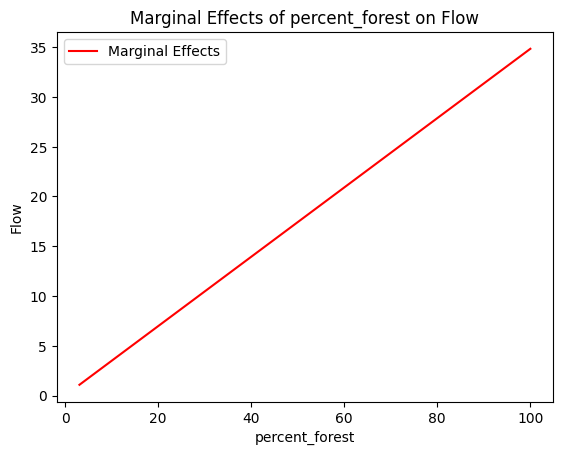

In [102]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from linearmodels.panel import PanelOLS

# Assuming df is your panel data DataFrame
y = df['flow']
x = df[['percent_forest']]
w = df['adkm2']

# Create a PanelOLS model
mod = PanelOLS(y, x, weights=w, entity_effects=False, time_effects=False)

# Fit the model
res = mod.fit()

# Create a DataFrame with the variable of interest
x_values = pd.DataFrame({'percent_forest': np.linspace(df['percent_forest'].min(), df['percent_forest'].max(), 100)})

# Use the predict method to obtain predicted values
y_values = res.predict(x_values)

# Plotting the marginal effects
# plt.scatter(df['percent_forest'], y, alpha=0.5, label='Actual data')
plt.plot(x_values['percent_forest'], y_values, color='red', label='Marginal Effects')
plt.title('Marginal Effects of percent_forest on Flow')
plt.xlabel('percent_forest')
plt.ylabel('Flow')
plt.legend()
plt.show()
